РАБОЧИЙ КОД

In [2]:
import importlib

def ensure_packages(packages):
    """
    Проверяет и устанавливает пакеты через %pip, если они не установлены.
    `packages` — список кортежей (pip_name, import_name)
    """
    for pip_name, import_name in packages:
        import_name = import_name or pip_name
        try:
            importlib.import_module(import_name)
        except ImportError:
            print(f"Устанавливаем: {pip_name}")
            from IPython import get_ipython
            get_ipython().run_line_magic('pip', f'install {pip_name}')

# Список нужных библиотек
required_packages = [
    ("tabulate", None),
    ("matplotlib", "matplotlib"),
    ("numpy", "numpy"),
    ("pandas", "pandas"),
    ("plotly", "plotly"),
]

# Установка
ensure_packages(required_packages)

# Теперь безопасно импортируем
from collections import deque, defaultdict
from tabulate import tabulate
from typing import List, Dict, Tuple, Set, Union, Any, Optional, Iterable
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.colors
import plotly.express as px
import plotly.graph_objects as go
import random
import time
from IPython.display import display, HTML
import uuid
import heapq
import re

In [3]:
### Внедрение стратегий выбора алгоритмов маршрутизации ###

def next_xyz_order_1st_algorithm(current: tuple[int, int, int],
                                 target_end: tuple[int, int, int]) -> tuple[int, int, int]:
    """
    Алгоритм выбора следующего шага по координатам в порядке X → Y → Z.

    Функция пытается приблизиться к целевой точке `target_end`, изменяя координаты текущей точки `current`
    по оси X сначала, затем по оси Y, и наконец по оси Z. Если координата текущей точки совпадает с целевой
    по оси, переходит к следующей оси. Если все координаты совпадают, возвращает текущую точку.

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).

    Returns:
        tuple[int, int, int]: Следующая позиция после одного шага к цели по приоритетному порядку осей.
    """
    x, y, z = current
    tx, ty, tz = target_end

    if x != tx:
        step = 1 if tx > x else -1
        return (x + step, y, z)
    elif y != ty:
        step = 1 if ty > y else -1
        return (x, y + step, z)
    elif z != tz:
        step = 1 if tz > z else -1
        return (x, y, z + step)
    return current

def next_random_axis_2nd_algorithm(current: tuple[int, int, int],
                                   target_end: tuple[int, int, int]) -> tuple[int, int, int]:
    """
    Алгоритм выбора следующего шага по случайной оси, на которой есть отличие от целевой точки.

    Функция выбирает случайную координатную ось из тех, где текущие координаты `current` отличаются
    от целевых `target_end`, и делает шаг в направлении уменьшения разницы по этой оси.
    Если все координаты совпадают, возвращает текущую точку без изменений.

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).

    Returns:
        tuple[int, int, int]: Следующая позиция после одного шага по случайно выбранной оси к цели.
    """
    directions = []
    for i in range(3):
        if current[i] != target_end[i]:
            directions.append(i)
    if not directions:
        return current
    axis = random.choice(directions)
    step = 1 if target_end[axis] > current[axis] else -1
    new_pos = list(current)
    new_pos[axis] += step
    return tuple(new_pos)

def next_max_diff_axis_3rd_algorithm(current: tuple[int, int, int],
                                    target_end: tuple[int, int, int]) -> tuple[int, int, int]:
    """
    Алгоритм выбора следующего шага по оси с максимальной разницей между текущими координатами и целевой точкой.
    Если несколько осей имеют одинаковую максимальную разницу, выбирается ось по приоритету Round_Robin: X → Y → Z.

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).

    Returns:
        tuple[int, int, int]: Следующая позиция после одного шага по оси с максимальной разницей.
                              Если текущая точка совпадает с целевой, возвращается текущая точка.
    """
    diffs = [abs(target_end[i] - current[i]) for i in range(3)]

    # Если все координаты уже совпадают
    if current == target_end:
        return current  # Маршрут завершён

    # Получаем максимальную разницу
    max_diff = max(diffs)

    # Переходим по приоритету X → Y → Z
    for axis in [0, 1, 2]:
        if diffs[axis] == max_diff and current[axis] != target_end[axis]:
            step = 1 if target_end[axis] > current[axis] else -1
            new_pos = list(current)
            new_pos[axis] += step
            return tuple(new_pos)

    return current

def next_max_diff_axis_safe_4th_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int]
) -> tuple[int, int, int]:
    """
    Алгоритм выбора следующего шага по оси с максимальной разницей с дополнительной проверкой "безопасности":
    выбирается шаг, который не приведёт к выходу за границы сетки и не попадёт в сломанные узлы.
    Если выбранный кандидат имеет хотя бы одного "живого" (не сломанного) соседнего узла по направлению к цели, шаг разрешён.
    Приоритет осей Round_Robin: X → Y → Z.

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).
        failed_nodes (set[tuple[int, int, int]]): Множество координат сломанных узлов.
        grid_size (tuple[int, int, int]): Размеры сетки по осям (max_x, max_y, max_z).

    Returns:
        tuple[int, int, int]: Следующая позиция для шага, если найдена безопасная, иначе возвращает текущую позицию.
    """
    #print(f"\nCurrent: {current}, Target: {target_end}")

    diffs = [abs(target_end[i] - current[i]) for i in range(3)]
    #print(f"abs(Delta_X): {diffs[0]}, abs(Delta_Y): {diffs[1]}, abs(Delta_Z): {diffs[2]}")

    max_diff = max(diffs)
    candidate_axes = [i for i, d in enumerate(diffs) if d == max_diff]

    # Приоритет X=0, Y=1, Z=2
    axes_priority = [0, 1, 2]

    # Сначала выбираем ось с максимальной разницей и по приоритету
    chosen_axis = None
    for axis in axes_priority:
        if axis in candidate_axes:
            chosen_axis = axis
            break

    #print(f"Chosen axis for movement: {['X','Y','Z'][chosen_axis]}")

    axes_to_try = [chosen_axis] + [axis for axis in axes_priority if axis != chosen_axis]

    for axis in axes_to_try:
        if current[axis] == target_end[axis]:
            #print(f"Axis {['X','Y','Z'][axis]} coordinate already matches target; skipping.")
            continue

        step = 1 if target_end[axis] > current[axis] else -1
        candidate = list(current)
        candidate[axis] += step
        candidate = tuple(candidate)

        if not all(0 <= candidate[i] < grid_size[i] for i in range(3)):
            #print(f"Candidate {candidate} is out of grid bounds; skipping.")
            continue

        if candidate in failed_nodes:
            #print(f"Candidate {candidate} is in failed nodes; trying next axis if any.")
            continue

        directional_neighbors = get_directional_neighbors(candidate, target_end, grid_size)

        #print(f"Trying candidate: {candidate}")
        #print(f"Directional neighbors: {directional_neighbors}")

        live_neighbors = [n for n in directional_neighbors if n not in failed_nodes]
        failed_neighbors = [n for n in directional_neighbors if n in failed_nodes]

        #print(f"Live neighbors: {live_neighbors}")
        #print(f"Failed neighbors: {failed_neighbors}")

        if len(directional_neighbors) == 0 or live_neighbors:
            #print(f"Candidate {candidate} accepted.")
            return candidate

        #print(f"Candidate {candidate} rejected, all directional neighbors failed.")

    #print("No valid candidates found, staying at current node.")
    return current

def next_max_diff_axis_safe_5th_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int]
) -> tuple[int, int, int]:
    """
    Алгоритм выбора следующего шага, ориентированный на оси с максимальной разницей,
    с безопасной проверкой и улучшенной логикой выбора оптимального шага по количеству "живых" соседей.
    Приоритет осей Round_Robin: X → Y → Z.

    Логика:
    - Определяет оси с максимальной разницей от текущей позиции до цели.
    - Формирует приоритет по осям, сначала максимальные разницы, затем остальные.
    - Для каждого кандидата вычисляет количество живых соседей в направлении к цели.
    - Выбирает кандидата с максимальным количеством живых соседей,
      при равенстве — выбирает по приоритету оси Round_Robin.
    - Если кандидатов нет или все имеют 0 живых соседей в направлении к цели — остаётся на текущей позиции.

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).
        failed_nodes (set[tuple[int, int, int]]): Множество координат сломанных узлов.
        grid_size (tuple[int, int, int]): Размеры сетки по осям (max_x, max_y, max_z).

    Returns:
        tuple[int, int, int]: Следующая позиция для шага, либо текущая, если нет подходящих кандидатов.
    """
    diffs = [abs(target_end[i] - current[i]) for i in range(3)]
    max_diff = max(diffs)
    candidate_axes = [i for i, d in enumerate(diffs) if d == max_diff]

    # Приоритет X=0, Y=1, Z=2
    full_priority = [0, 1, 2]

    # axes_priority как в 4-м алгоритме
    axes_priority = [axis for axis in full_priority if axis in candidate_axes] + \
                    [axis for axis in full_priority if axis not in candidate_axes]

    candidates_info = []

    for axis in axes_priority:
        if current[axis] == target_end[axis]:
            continue

        step = 1 if target_end[axis] > current[axis] else -1
        candidate = list(current)
        candidate[axis] += step
        candidate = tuple(candidate)

        if not all(0 <= candidate[i] < grid_size[i] for i in range(3)):
            continue

        if candidate in failed_nodes:
            continue

        if candidate == target_end:
            return candidate

        directional_neighbors = get_directional_neighbors(candidate, target_end, grid_size)
        live_neighbors = [n for n in directional_neighbors if n not in failed_nodes]

        candidates_info.append((candidate, axis, len(live_neighbors)))

    if not candidates_info:
        return current

    if all(info[2] == 0 for info in candidates_info):
        return current

    max_live_neighbors = max(info[2] for info in candidates_info)
    best_candidates = [info for info in candidates_info if info[2] == max_live_neighbors]
    best_candidates.sort(key=lambda x: axes_priority.index(x[1]))
    best_candidate = best_candidates[0][0]

    return best_candidate

def next_max_diff_axis_safe_detour_6th_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int],
    prev_node: tuple[int, int, int] | None = None,
) -> tuple[int, int, int]:
    """
    Алгоритм‑6 ─ «Max‑Diff Safe + Detour».

    Базируется на логике 5‑го алгоритма (Max‑Diff Safe, выбор по live‑score),
    но добавляет *fallback‑обход* на случай тупика.

    ────────────────────────────────────────────────────────────────────
    ЭТАП 1 — как в 5‑м алгоритме
        1. Выбираем ось/оси с максимальной разницей до цели.
        2. Формируем приоритет (X→Y→Z).
        3. Для каждого кандидата:
              • не выходит за пределы сетки;
              • не в failed_nodes;
              • живой score > 0 (есть directed‑neighbor к цели).
        4. Берём кандидата с максимальным live‑score
           (tie‑break — приоритет осей).
        5. Если кандидат найден — шаг готов.

    ЭТАП 2 — detour (срабатывает, если ЭТАП 1 не дал хода)
        1. Рассматриваем 6 ортогональных соседей current.
        2. Отбрасываем соседа, если:
              • он == prev_node (шаг назад);
              • он ведёт **ближе к цели** (Манхэттен‑дистанция уменьшается)
                ─ такие узлы уже признаны тупиками;
              • выходит за границы или сломан.
        3. Для оставшихся считаем live‑score (как в ЭТАП 1).
        4. Берём узел с максимальным live‑score
           (tie‑break: X→Y→Z по изменённой координате).
        5. Если кандидатов нет — остаёмся на месте.

    Args
    ----
    current : tuple[int, int, int]
        Текущая позиция (x, y, z).

    target_end : tuple[int, int, int]
        Конечная цель (tx, ty, tz).

    failed_nodes : set[tuple[int, int, int]]
        Координаты недоступных (сломаных) узлов.

    grid_size : tuple[int, int, int]
        Размеры сетки (max_x, max_y, max_z).

    prev_node : tuple[int, int, int] | None
        Предыдущий узел маршрута. Нужен, чтобы не сделать шаг назад
        при обходе. Для первого шага передавайте None.

    Returns
    -------
    tuple[int, int, int]
        Следующая координата. Если ни прямой, ни обходной ход невозможен,
        возвращается `current`.
    """
    def in_bounds(p: tuple[int, int, int]) -> bool:
        return all(0 <= p[i] < grid_size[i] for i in range(3))

    def step_axis(pos: tuple[int, int, int], axis: int, sign: int) -> tuple[int, int, int]:
        nxt = list(pos)
        nxt[axis] += sign
        return tuple(nxt)                                              # type: ignore[return-value]

    def live_score(node: tuple[int, int, int]) -> int:
        score = 0
        for ax in range(3):
            if node[ax] == target_end[ax]:
                continue
            nxt = step_axis(node, ax, 1 if target_end[ax] > node[ax] else -1)
            if in_bounds(nxt) and nxt not in failed_nodes:
                score += 1
        return score

    # ---------- ЭТАП 1: логика 5‑го алгоритма ---------------------------
    diffs = [abs(target_end[i] - current[i]) for i in range(3)]
    max_diff = max(diffs)
    axes_priority = [ax for ax in (0, 1, 2) if diffs[ax] == max_diff] + \
                    [ax for ax in (0, 1, 2) if diffs[ax] != max_diff]

    best, best_live, best_axis_rank = None, -1, 9
    for ax in axes_priority:
        if current[ax] == target_end[ax]:
            continue
        cand = step_axis(current, ax, 1 if target_end[ax] > current[ax] else -1)
        if not in_bounds(cand) or cand in failed_nodes:
            continue
        if cand == target_end:
            return cand
        ls = live_score(cand)
        if ls == 0:
            continue
        rank = axes_priority.index(ax)
        if ls > best_live or (ls == best_live and rank < best_axis_rank):
            best, best_live, best_axis_rank = cand, ls, rank

    if best is not None:                       # удалось сделать нормальный шаг
        return best

    # ---------- ЭТАП 2: fallback‑detour --------------------------------
    neighbor_dirs = [(-1,0,0),(1,0,0),(0,-1,0),(0,1,0),(0,0,-1),(0,0,1)]
    detours: list[tuple[int,int,tuple[int,int,int]]] = []  # (live, axisRank, node)

    dist_cur = sum(abs(current[i] - target_end[i]) for i in range(3))

    for dx, dy, dz in neighbor_dirs:
        n = (current[0]+dx, current[1]+dy, current[2]+dz)
        if not in_bounds(n) or n in failed_nodes:
            continue
        if prev_node is not None and n == prev_node:
            continue
        dist_n = sum(abs(n[i] - target_end[i]) for i in range(3))
        if dist_n < dist_cur:                 # ведёт к цели → уже проверяли, заблокировано
            continue
        ls = live_score(n)
        if ls == 0:
            continue
        axis_rank = (abs(dx), abs(dy), abs(dz)).index(1)   # какая ось изменилась
        detours.append((ls, axis_rank, n))

    if detours:
        detours.sort(key=lambda x: (-x[0], x[1]))          # max live → min axis rank
        return detours[0][2]

    return current

def next_max_diff_axis_safe_step_in_dead_end_7th_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int],
    prev_node: tuple[int, int, int] | None = None,
) -> tuple[int, int, int]:
    """
    Алгоритм‑7 — Max‑Diff Safe + Detour + Dead-End Awareness.

    • Этап 1 — как в алгоритме-5: выбираем шаг по оси с max‑diff и live‑score (>0).
    • Этап 2 — если шаг невозможен:
        ─ Проверяем соседей (ортогональных 6):
            ─ если кандидат — ПОЛНЫЙ ТУПИК (все соседи кроме current недоступны) — игнорируем;
            ─ если кандидат — ПОЛУТУПИК — входим и включаем обход;
        ─ Если ничего не найдено — остаёмся и включаем обход.

    prev_node нужен для предотвращения шага назад при обходе.
    """
    def in_bounds(p: tuple[int, int, int]) -> bool:
        return all(0 <= p[i] < grid_size[i] for i in range(3))

    def step_axis(pos: tuple[int, int, int], axis: int, sign: int) -> tuple[int, int, int]:
        nxt = list(pos)
        nxt[axis] += sign
        return tuple(nxt)

    def live_score(node: tuple[int, int, int]) -> int:
        score = 0
        for ax in range(3):
            if node[ax] == target_end[ax]:
                continue
            nxt = step_axis(node, ax, 1 if target_end[ax] > node[ax] else -1)
            if in_bounds(nxt) and nxt not in failed_nodes:
                score += 1
        return score

    def is_full_dead_end(node: tuple[int, int, int], from_node: tuple[int, int, int]) -> bool:
        blocked = 0
        for dx, dy, dz in [(-1,0,0),(1,0,0),(0,-1,0),(0,1,0),(0,0,-1),(0,0,1)]:
            neighbor = (node[0]+dx, node[1]+dy, node[2]+dz)
            if neighbor == from_node:
                continue
            if not in_bounds(neighbor) or neighbor in failed_nodes:
                blocked += 1
        return blocked >= 5  # полный тупик, все кроме from_node заблокированы

    # ───── ЭТАП 1 — логика 5-го ──────────────────────────────
    diffs = [abs(target_end[i] - current[i]) for i in range(3)]
    max_diff = max(diffs)
    axes_priority = [ax for ax in (0,1,2) if diffs[ax] == max_diff] + \
                    [ax for ax in (0,1,2) if diffs[ax] != max_diff]

    best, best_live, best_axis_rank = None, -1, 9
    for ax in axes_priority:
        if current[ax] == target_end[ax]:
            continue
        cand = step_axis(current, ax, 1 if target_end[ax] > current[ax] else -1)
        if not in_bounds(cand) or cand in failed_nodes:
            continue
        if cand == target_end:
            return cand
        ls = live_score(cand)
        if ls == 0:
            continue
        rank = axes_priority.index(ax)
        if ls > best_live or (ls == best_live and rank < best_axis_rank):
            best, best_live, best_axis_rank = cand, ls, rank

    if best is not None:
        return best

    # ───── ЭТАП 2 — обработка тупиков ────────────────────────
    neighbor_dirs = [(-1,0,0),(1,0,0),(0,-1,0),(0,1,0),(0,0,-1),(0,0,1)]
    detours: list[tuple[int,int,tuple[int,int,int]]] = []  # (live, axisRank, node)
    dist_cur = sum(abs(current[i] - target_end[i]) for i in range(3))

    for dx, dy, dz in neighbor_dirs:
        n = (current[0]+dx, current[1]+dy, current[2]+dz)
        if not in_bounds(n) or n in failed_nodes:
            continue
        if prev_node is not None and n == prev_node:
            continue
        dist_n = sum(abs(n[i] - target_end[i]) for i in range(3))
        # Возможно, стоит закомментировать эту проверку, чтобы проверить поведение
        # if dist_n < dist_cur:
        #     continue  # такие узлы уже проверены ранее
    
        blocked_neighbors = 0
        for ddx, ddy, ddz in neighbor_dirs:
            nn = (n[0]+ddx, n[1]+ddy, n[2]+ddz)
            if nn == current:
                continue
            if not in_bounds(nn) or nn in failed_nodes:
                blocked_neighbors += 1
    
        if blocked_neighbors >= 5:
            # Полный тупик — пропускаем
            continue
    
        ls = live_score(n)  # может быть 0 или больше
        axis_rank = (abs(dx), abs(dy), abs(dz)).index(1)
        detours.append((ls, axis_rank, n))

    if detours:
        detours.sort(key=lambda x: (-x[0], x[1]))
        return detours[0][2]

    return current

def next_max_diff_axis_safe_step_in_dead_end_backstep_8th_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int],
    prev_node: tuple[int, int, int] | None = None,
) -> tuple[int, int, int] | None:
    """
    8-й алгоритм — расширение 7-го: Max‑Diff Safe + Detour + Dead-End Awareness + Backstep.

    • Шаг 1: применяет 7-й алгоритм.
    • Шаг 2: если 7-й вернул текущую точку (тупик):
        — добавляет current в failed_nodes,
        — возвращает prev_node (откат назад),
        — если prev_node отсутствует — маршрут невозможен.
    """

    # Шаг 1 — обычный 7-й алгоритм
    next_node = next_max_diff_axis_safe_step_in_dead_end_7th_algorithm(
        current, target_end, failed_nodes, grid_size, prev_node
    )

    if next_node != current:
        return next_node  # успех

    # Шаг 2 — тупик: current → failed, попытка отката назад
    failed_nodes.add(current)

    if prev_node is None:
        return None  # некуда откатиться

    return prev_node  # делаем шаг назад



#=== LOFT Algorithm"

# ───── Запрещённые повороты для Complete-OE ─────
FORBIDDEN_TURNS = {
    0: {
        0: {('N','W'), ('S','W')},
        1: {('E','S'), ('E','N')}
    },
    1: {
        0: {('W','S'), ('E','S')},
        1: {('N','E'), ('N','W')}
    },
    2: {
        0: {('N','E'), ('S','E')},
        1: {('W','S'), ('W','N')}
    },
    3: {
        0: {('W','N'), ('E','N')},
        1: {('S','E'), ('S','W')}
    },
}

DIRECTIONS_3D = {
    'E': (1, 0, 0),
    'W': (-1, 0, 0),
    'N': (0, 1, 0),
    'S': (0, -1, 0),
    'Z+': (0, 0, 1),
    'Z-': (0, 0, -1),
}

# ───── Вспомогательные функции ─────
def in_bounds(node: Tuple[int, int, int], grid_size: Tuple[int, int, int]) -> bool:
    """Проверяет, находится ли узел в границах сетки."""
    return all(0 <= node[i] < grid_size[i] for i in range(3))

def is_link_valid(a: Tuple[int, int, int], b: Tuple[int, int, int], faulty_links: Set[Tuple[Tuple[int,int,int], Tuple[int,int,int]]]) -> bool:
    """Проверяет, не является ли связь сломанной."""
    return not ((a, b) in faulty_links or (b, a) in faulty_links)

def dist_to_target(node: Tuple[int, int, int], target_end: Tuple[int, int, int]) -> int:
    """Вычисляет манхэттенское расстояние до цели."""
    return sum(abs(node[i] - target_end[i]) for i in range(3))

def get_dir(a: Tuple[int, int, int], b: Tuple[int, int, int]) -> str | None:
    """Определяет направление движения между узлами."""
    delta = tuple(b[i]-a[i] for i in range(3))
    for k, v in DIRECTIONS_3D.items():
        if v == delta:
            return k
    return None

def violates_turn_constraints(prev: Optional[Tuple[int, int, int]], current: Tuple[int, int, int], nxt: Tuple[int, int, int]) -> bool:
    """Проверяет нарушение горизонтальных правил поворотов Complete-OE."""
    if prev is None: return False
    in_dir = get_dir(prev, current)
    out_dir = get_dir(current, nxt)
    if in_dir is None or out_dir is None or in_dir in ('Z+', 'Z-') or out_dir in ('Z+', 'Z-'):
        return False
    z_mod = current[2] % 4
    parity = current[0] % 2 if z_mod in (0, 2) else current[1] % 2
    forbidden = FORBIDDEN_TURNS.get(z_mod, {}).get(parity, set())
    return (in_dir, out_dir) in forbidden

def violates_vertical_turn_constraints(prev: Optional[Tuple[int, int, int]], current: Tuple[int, int, int], nxt: Tuple[int, int, int]) -> bool:
    """Проверяет нарушение вертикальных правил поворотов."""
    if prev is None: return False
    in_dir = get_dir(prev, current)
    out_dir = get_dir(current, nxt)
    if out_dir not in ('Z+', 'Z-') or in_dir in ('Z+', 'Z-'):
        return False
    z = current[2]
    if z % 2 == 1 and out_dir == 'Z+': return True
    if z % 2 == 0 and out_dir == 'Z-': return True
    return False

def live_score_directional(node: Tuple[int, int, int], target_end: Tuple[int, int, int], grid_size: Tuple[int, int, int], failed_nodes: Set[Tuple[int, int, int]], faulty_links: Set[Tuple[Tuple[int,int,int], Tuple[int,int,int]]]) -> int:
    """Вычисляет количество соседей, которые приближают к цели."""
    score = 0
    current_dist = dist_to_target(node, target_end)
    for delta in DIRECTIONS_3D.values():
        nxt = tuple(node[i] + delta[i] for i in range(3))
        if not in_bounds(nxt, grid_size) or nxt in failed_nodes or not is_link_valid(node, nxt, faulty_links):
            continue
        if dist_to_target(nxt, target_end) < current_dist:
            score += 1
    return score

def dp_cost(c_node: Tuple[int, int, int], n_node: Tuple[int, int, int], congestion_map: Dict) -> int:
    """Возвращает стоимость перехода на основе загруженности."""
    direction = get_dir(c_node, n_node)
    if not direction: return float('inf')
    return congestion_map.get(c_node, {}).get(direction, 0)

# --- Вспомогательная функция для выбора кандидатов ---
def _find_next_loft_node(current: Tuple[int, int, int], target_end: Tuple[int, int, int], grid_size: Tuple[int, int, int],
                      failed_nodes: Set[Tuple[int, int, int]], faulty_links: Set[Tuple[Tuple[int,int,int], Tuple[int,int,int]]],
                      prev_node: Optional[Tuple[int, int, int]], congestion_map: Dict,
                      mode_minimal: bool, path: List[Tuple[int, int, int]], dead_ends: Set[Tuple[int, int, int]], fault_table: Dict):
    base_dist = dist_to_target(current, target_end)
    candidates = []

    for dir_name, delta in DIRECTIONS_3D.items():
        nxt = tuple(current[i] + delta[i] for i in range(3))

        if (not in_bounds(nxt, grid_size) or nxt in failed_nodes or not is_link_valid(current, nxt, faulty_links) or
            fault_table.get(current, {}).get(dir_name, 1) == 0 or
            (prev_node is not None and nxt == prev_node) or nxt in dead_ends or
            nxt in path or  # 👈 Ключевое исправление: не ходить по уже пройденным узлам
            violates_turn_constraints(prev_node, current, nxt) or
            violates_vertical_turn_constraints(prev_node, current, nxt) or
            (mode_minimal and dist_to_target(nxt, target_end) >= base_dist)):
            continue

        dp = dp_cost(current, nxt, congestion_map)
        ls = live_score_directional(nxt, target_end, grid_size, failed_nodes, faulty_links)
        candidates.append((dp, -ls, dist_to_target(nxt, target_end), nxt))
    
    candidates.sort(key=lambda x: (x[0], x[1], x[2]))
    return candidates

# ───── Основной LOFT-алгоритм ─────
def loft_algorithm(start: Tuple[int, int, int], target_end: Tuple[int, int, int], grid_size: Tuple[int, int, int],
                   failed_nodes: Set[Tuple[int, int, int]] = set(), faulty_links: Set[Tuple[Tuple[int,int,int], Tuple[int,int,int]]] = set(),
                   congestion_map: Optional[Dict] = None, fault_table: Optional[Dict] = None, max_steps: int = 500):
    """
    Основной алгоритм LOFT-маршрутизации с механизмом отката (backtracking).
    Возвращает весь маршрут, статус и причину завершения.
    """
    if congestion_map is None: congestion_map = {}
    if fault_table is None: fault_table = {}

    path = [start]
    dead_ends = set()

    while path and len(path) < max_steps:
        current = path[-1]
        prev_node = path[-2] if len(path) > 1 else None
        
        if current == target_end:
            return path, "SUCCESS", "Достигнута конечная точка"
        
        # Этап 1: минимальные шаги
        candidates = _find_next_loft_node(current, target_end, grid_size, failed_nodes, faulty_links, prev_node, congestion_map, True, path, dead_ends, fault_table)
        
        # Этап 2: обходные шаги (detour)
        if not candidates:
            candidates = _find_next_loft_node(current, target_end, grid_size, failed_nodes, faulty_links, prev_node, congestion_map, False, path, dead_ends, fault_table)

        if candidates:
            nxt = candidates[0][3]
            path.append(nxt)
        else:
            dead_ends.add(current)
            path.pop()

    status = "FAILED"
    reason = "Маршрут не найден."
    if len(path) >= max_steps:
        reason = "Превышено максимальное количество шагов."
    return path, status, reason

In [4]:
# === Вспомогательные функции ===

def get_neighbors_3d(node: tuple[int, int, int],
                     grid_size: tuple[int, int, int]) -> list[tuple[int, int, int]]:
    """
    Возвращает список всех соседних узлов в 3D-сетке, находящихся ровно на один шаг
    по каждой из шести возможных осей (X, Y, Z), учитывая границы сетки.

    Для каждой из трех координат (x, y, z) добавляет соседей с координатами:
    - на единицу меньше по данной оси, если в пределах сетки;
    - на единицу больше по данной оси, если в пределах сетки.

    Args:
        node (tuple[int, int, int]): Текущие координаты узла (x, y, z).
        grid_size (tuple[int, int, int]): Размеры 3D-сетки (max_x, max_y, max_z).

    Returns:
        list[tuple[int, int, int]]: Список соседних узлов, находящихся в пределах сетки.
    """
    x, y, z = node
    directions = [(-1, 0, 0), (1, 0, 0),
                  (0, -1, 0), (0, 1, 0),
                  (0, 0, -1), (0, 0, 1)]
    neighbors = []
    for dx, dy, dz in directions:
        nx, ny, nz = x + dx, y + dy, z + dz
        if 0 <= nx < grid_size[0] and 0 <= ny < grid_size[1] and 0 <= nz < grid_size[2]:
            neighbors.append((nx, ny, nz))
    return neighbors

def get_directional_neighbors(node: tuple[int, int, int],
                              target: tuple[int, int, int],
                              grid_size: tuple[int, int, int]) -> list[tuple[int, int, int]]:
    """
    Возвращает список соседних узлов, расположенных ровно на один шаг ближе к целевой точке `target`
    по каждой координатной оси, в пределах границ сетки.

    Для каждой из трёх координат (x, y, z):
    - Если координата текущей точки меньше соответствующей координаты цели,
      в список добавляется сосед с увеличенной на 1 координатой.
    - Если больше — добавляется сосед с уменьшенной на 1 координатой.
    - Если равна — соседа по этой оси не добавляется.

    Аргументы:
        node (tuple[int, int, int]): Текущие координаты узла.
        target (tuple[int, int, int]): Координаты целевой точки.
        grid_size (tuple[int, int, int]): Размеры 3D-сетки по осям (максимальные координаты).

    Возвращает:
        list[tuple[int, int, int]]: Список соседних узлов, ближе расположенных к цели,
                                    учитывая границы сетки.
    """
    neighbors = []
    for i in range(3):
        if node[i] < target[i]:
            candidate = list(node)
            candidate[i] += 1
            if candidate[i] < grid_size[i]:
                neighbors.append(tuple(candidate))
        elif node[i] > target[i]:
            candidate = list(node)
            candidate[i] -= 1
            if candidate[i] >= 0:
                neighbors.append(tuple(candidate))
    return neighbors

def manhattan_distance_3d(a: tuple[int, int, int], b: tuple[int, int, int]) -> int:
    """
    Вычисляет Манхэттенское расстояние между двумя точками в трёхмерном пространстве.

    Манхэттенское расстояние — это сумма абсолютных разниц по каждой координате,
    отражающая путь, если движение возможно только вдоль осей.

    Args:
        a (tuple[int, int, int]): Координаты первой точки (x, y, z).
        b (tuple[int, int, int]): Координаты второй точки (x, y, z).

    Returns:
        int: Манхэттенское расстояние между точками a и b.
    """
    return abs(a[0] - b[0]) + abs(a[1] - b[1]) + abs(a[2] - b[2])

def generate_faulty_nodes(size: int, percentage: float, exclude_points: set) -> set:
    """
    Генерирует множество случайных "сломанных" узлов в 3D-сетке кубической формы.

    Args:
        size (int): Размер стороны кубической 3D-сетки (размер по каждой оси).
        percentage (float): Процент узлов, которые должны быть помечены как сломанные (от 0 до 100).
        exclude_points (set of tuple[int, int, int]): Множество координат узлов, которые нельзя помечать как сломанные.

    Returns:
        set of tuple[int, int, int]: Множество координат сломанных узлов, выбранных случайным образом,
                                     исключая указанные в exclude_points.

    Raises:
        ValueError: Если percentage вне диапазона 0-100.
    """
    all_nodes = [(x, y, z)
                 for x in range(size)
                 for y in range(size)
                 for z in range(size)]
    for pt in exclude_points:
        if pt in all_nodes:
            all_nodes.remove(pt)
    faulty_count = int(len(all_nodes) * percentage / 100)
    random.shuffle(all_nodes)
    return set(all_nodes[:faulty_count])

def compute_astar_distance(start, end, failed_nodes, grid_size):

    def in_bounds(p):
        return all(0 <= p[i] < grid_size[i] for i in range(3))

    def manhattan(a, b):
        return sum(abs(a[i] - b[i]) for i in range(3))

    if start == end:
        return 0

    open_heap = [(manhattan(start, end), 0, start)]
    visited = set()

    while open_heap:
        f, g, node = heapq.heappop(open_heap)
        if node in visited:
            continue
        visited.add(node)

        if node == end:
            return g

        for dx, dy, dz in [(-1,0,0),(1,0,0),(0,-1,0),(0,1,0),(0,0,-1),(0,0,1)]:
            n = (node[0]+dx, node[1]+dy, node[2]+dz)
            if not in_bounds(n) or n in failed_nodes or n in visited:
                continue
            heapq.heappush(open_heap, (g + 1 + manhattan(n, end), g + 1, n))

    return None

def astar_algorithm(
    current: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int]
) -> tuple[int, int, int]:
    """
    A*‑алгоритм для выбора следующего шага к цели в 3D‑сетки с учётом препятствий.

    Логика:
    - Использует эвристику A* с манхэттенским расстоянием (g + h).
    - Ищет кратчайший путь от текущего узла до цели с обходом препятствий.
    - Возвращает следующий шаг из найденного пути.
    - Если путь не найден, остаётся на месте.

    Ограничения:
    - Учитывает размеры сетки (`grid_size`).
    - Исключает сломанные узлы (`failed_nodes`).
    - Работает только с ортогональными соседями (6 направлений).

    Args:
        current (tuple[int, int, int]): Текущие координаты (x, y, z).
        target_end (tuple[int, int, int]): Целевые координаты (tx, ty, tz).
        failed_nodes (set[tuple[int, int, int]]): Множество координат сломанных узлов.
        grid_size (tuple[int, int, int]): Размеры сетки (max_x, max_y, max_z).

    Returns:
        tuple[int, int, int]: Следующая координата на пути, либо текущая, если путь не найден.
    """
    def in_bounds(p: tuple[int, int, int]) -> bool:
        return all(0 <= p[i] < grid_size[i] for i in range(3))

    def manhattan(a: tuple[int, int, int], b: tuple[int, int, int]) -> int:
        return sum(abs(a[i] - b[i]) for i in range(3))

    if current == target_end:
        return current

    open_heap = [(manhattan(current, target_end), 0, current, [])]  # (f=g+h, g, node, path)
    visited = set()

    while open_heap:
        f, g, node, path = heapq.heappop(open_heap)
        if node in visited:
            continue
        visited.add(node)
        path = path + [node]

        if node == target_end:
            return path[1] if len(path) >= 2 else current

        for dx, dy, dz in [(-1,0,0),(1,0,0),(0,-1,0),(0,1,0),(0,0,-1),(0,0,1)]:
            n = (node[0]+dx, node[1]+dy, node[2]+dz)
            if not in_bounds(n):
                continue
            if n in failed_nodes or n in visited:
                continue
            heapq.heappush(open_heap, (g + 1 + manhattan(n, target_end), g + 1, n, path))

    return current  # путь не найден

In [5]:
# === Основной алгоритм маршрута ===

def build_route_3d(
    start: tuple[int, int, int],
    target_end: tuple[int, int, int],
    failed_nodes: set[tuple[int, int, int]],
    grid_size: tuple[int, int, int] = (10, 10, 10),
    strategy: str = "algorithm_5th_safe_optimized"
) -> tuple[list[tuple[int, int, int]], str, str]:
    """
    Строит маршрут от начальной точки до целевой в 3D-сетке с учётом отказавших узлов,
    используя заданную стратегию выбора следующего шага.

    Алгоритм последовательно выбирает следующий узел по выбранной стратегии,
    проверяет его валидность (не выход за границы сетки, не посещён ранее, не отказавший),
    и формирует маршрут до достижения цели или обнаружения ошибки.

    Аргументы:
        start (tuple[int, int, int]): Начальная точка маршрута (x, y, z).
        target_end (tuple[int, int, int]): Целевая конечная точка (x, y, z).
        failed_nodes (set[tuple[int, int, int]]): Множество координат отказавших узлов.
        grid_size (tuple[int, int, int], опционально): Размеры сетки (max_x, max_y, max_z). По умолчанию (10,10,10).
        strategy (str, опционально): Стратегия выбора следующего шага. Поддерживаемые варианты:
            - "algorithm_astar"
            - "algorithm_1st_xyz"
            - "algorithm_2nd_random"
            - "algorithm_3rd_smart"
            - "algorithm_4th_safe"
            - "algorithm_5th_safe_optimized"
            - "algorithm_6th_detour"
          По умолчанию "smart" (соответствует "algorithm_3rd_smart").

    Возвращает:
        tuple[
            list[tuple[int, int, int]],  # Построенный путь от start к target_end (возможно частичный)
            str,                         # Статус: "SUCCESS" или "FAILED"
            str                          # Причина завершения (успех или описание ошибки)
        ]
    """
    if strategy == "loft_algorithm":
        # loft_algorithm является самодостаточным и возвращает полный путь.
        # Поэтому вызываем его напрямую и возвращаем результат.
        return loft_algorithm(
            start=start, 
            target_end=target_end, 
            grid_size=grid_size, 
            failed_nodes=failed_nodes
        )
    
    path = [start]
    visited = set(path)
    visit_counts: dict[tuple[int, int, int], int] = {start: 1}
    current = start
    prev_node = None
    
    # Стратегии, в которых разрешено повторное посещение вершин
    strategies_with_repeat_allowed = {} #{"algorithm_6th_detour"}
    count_allowed = 10
    
    while current != target_end:
        if strategy == "algorithm_astar":
            next_node = astar_algorithm(current, target_end, failed_nodes, grid_size)
        elif strategy == "algorithm_1st_xyz":
            next_node = next_xyz_order_1st_algorithm(current, target_end)
        elif strategy == "algorithm_2nd_random":
            next_node = next_random_axis_2nd_algorithm(current, target_end)
        elif strategy == "algorithm_3rd_smart":
            next_node = next_max_diff_axis_3rd_algorithm(current, target_end)
        elif strategy == "algorithm_4th_safe":
            next_node = next_max_diff_axis_safe_4th_algorithm(current, target_end, failed_nodes, grid_size)
        elif strategy == "algorithm_5th_safe_optimized":
            next_node = next_max_diff_axis_safe_5th_algorithm(current, target_end, failed_nodes, grid_size)
        elif strategy == "algorithm_6th_detour":
            next_node = next_max_diff_axis_safe_detour_6th_algorithm(current, target_end, failed_nodes, grid_size, prev_node)
        elif strategy == "algorithm_7th_detour_step_in_dead_end":
            next_node = next_max_diff_axis_safe_step_in_dead_end_7th_algorithm(current, target_end, failed_nodes, grid_size, prev_node)
        elif strategy == "algorithm_8th_detour_step_in_dead_end_backstep":
            next_node = next_max_diff_axis_safe_step_in_dead_end_backstep_8th_algorithm(current, target_end, failed_nodes, grid_size, prev_node)
        else:
            raise ValueError(f"Unknown strategy: {strategy}")

        # Ограничение на число посещений одной точки (всегда)
        count = visit_counts.get(next_node, 0)
        if count >= count_allowed:
            return path, "FAILED", f"Точка {next_node} посещалась уже {count} раз"

        # Проверка: стратегия вернула None — маршрут невозможен
        if next_node is None:
            return path, "FAILED", f"Алгоритм не смог выбрать следующую точку из {current}"

        # Проверка допустимости: повторное посещение (запрещено, если не входит в разрешённые стратегии)
        if strategy not in strategies_with_repeat_allowed and next_node in visited and next_node != prev_node:
            return path, "FAILED", f"Следующая точка {next_node} уже была посещена"

        # Проверка границ
        if not all(0 <= next_node[i] < grid_size[i] for i in range(3)):
            return path, "FAILED", f"Следующая точка {next_node} вне сетки"

        # Запрет на проход по отказавшим узлам
        if next_node in failed_nodes:
            return path, "FAILED", f"Следующая точка {next_node} является отказавшим узлом"

        # Шаг принят
        path.append(next_node)
        visited.add(next_node)
        visit_counts[next_node] = count + 1
        prev_node = current
        current = next_node

    return path, "SUCCESS", "Достигнута конечная точка"

# === Маршрутный тест ===

def test_routes(grid_size: int,
                N: int,
                fault_percentage: float,
                start_end_pairs: list[tuple[tuple[int,int,int], tuple[int,int,int]]] = None,
                seed: int = None,
                strategy: str = "smart") -> dict:
    """
    Запускает серию тестов маршрутизации в 3D-сетке с заданными параметрами.

    Параметры:
    -----------
    grid_size : int
        Размер стороны кубической сетки (сетка размера grid_size x grid_size x grid_size).
    N : int
        Количество маршрутов для генерации и тестирования.
    fault_percentage : float
        Процент отказавших узлов (узлов, по которым проходить нельзя) от общего числа узлов.
    start_end_pairs : list[tuple[tuple[int,int,int], tuple[int,int,int]]], optional
        Список пар (start, end) координат для маршрутов. Если None, пары будут сгенерированы случайно.
        Каждая точка — кортеж из трёх целых координат (x, y, z).
    seed : int, optional
        Значение начального зерна для генератора случайных чисел. Если None, будет сгенерировано случайное.
    strategy : str, optional
        Имя стратегии алгоритма маршрутизации, передаваемое в функцию построения маршрута `build_route_3d`.
        По умолчанию "smart".

    Возвращаемое значение:
    -----------------------
    dict
        Словарь с результатами теста, содержащий ключи:
        - "paths": list[list[tuple[int,int,int]]], список пройденных путей для каждого маршрута.
        - "statuses": list[str], статусы маршрутов ("success" или "failed").
        - "reasons": list[str], текстовые объяснения причин успеха/ошибки.
        - "failed_nodes": set[tuple[int,int,int]], множество узлов, которые считаются отказавшими.
        - "start_end_pairs": list[tuple[tuple[int,int,int], tuple[int,int,int]]], список использованных пар начальных и конечных точек.
        - "seed": int, использованное зерно генератора случайных чисел для воспроизводимости.
        - "route_infos": list[str], подробные текстовые описания каждого маршрута и результата.

    Описание работы:
    -----------------
    - Если пары начальных и конечных точек не переданы, генерируются случайные уникальные пары.
    - Создается множество отказавших узлов (failed_nodes) с указанным процентом.
      Начальная и конечная точки маршрутов не могут попасть в отказавшие узлы.
    - Для каждой пары (start, end) запускается построение маршрута с выбранной стратегией.
    - Для каждого маршрута собирается информация о результате (путь, статус, причина),
      а также рассчитываются длина маршрута и манхэттенское расстояние.
    - Возвращается словарь со всеми результатами для последующего анализа и вывода.

    Пример использования:
    ---------------------
    result = test_routes(grid_size=10, N=5, fault_percentage=5.0, strategy="algorithm_4th_safe")
    print(result["route_infos"][0])
    """
    if seed is None:
        seed = random.randint(0, 999999)
    random.seed(seed)

    size = grid_size
    grid_dims = (size, size, size)

    if start_end_pairs is None:
        used_points = set()
        start_end_pairs = []
        while len(start_end_pairs) < N:
            start = tuple(random.randint(0, size - 1) for _ in range(3))
            end = tuple(random.randint(0, size - 1) for _ in range(3))
            if start != end and start not in used_points and end not in used_points:
                start_end_pairs.append((start, end))
                used_points.update([start, end])

    all_critical_points = [pt for pair in start_end_pairs for pt in pair]
    failed_nodes = generate_faulty_nodes(size, fault_percentage, all_critical_points)

    paths, statuses, reasons, route_infos = [], [], [], []

    for idx, (start, end) in enumerate(start_end_pairs):
        route, status, reason = build_route_3d(
            start, end, failed_nodes,
            grid_dims,
            strategy=strategy  # <-- Передаём стратегию
        )
        paths.append(route)
        statuses.append(status.lower())
        reasons.append(reason)

        info = (
            f"Route {idx+1}:\n"
            f"  Start Node:          {start}\n"
            f"  End Node:            {end}\n"
            f"  Manhattan Distance:  {manhattan_distance_3d(start, end)}\n"
            f"  Real Distance:       {len(route) - 1}\n"
            f"  Status:              {status}\n"
        )

        if status == "FAILED":
            info += (
                f"  Failure Point:       {route[-1] if route else 'N/A'}\n"
                f"  Reason:              {reason}\n"
            )

        info += (
            f"  Fault Nodes Number:  {len(failed_nodes)}\n"
            f"  Fault Nodes:         {sorted(failed_nodes)}\n"
            f"  Route Path:          {route}\n"
            #+ "-" * 40
        )

        route_infos.append(info)

    return {
        "paths": paths,
        "statuses": statuses,
        "reasons": reasons,
        "failed_nodes": failed_nodes,
        "start_end_pairs": start_end_pairs,
        "seed": seed,
        "route_infos": route_infos
    }

# === Визуализация маршрутов ===

def plot_multiple_routes_3d(routes: list[tuple[list[tuple[int, int, int]], tuple[int, int, int], tuple[int, int, int]]],
                            failed_nodes: set[tuple[int, int, int]],
                            grid_size: tuple[int, int, int] = (10, 10, 10),
                            strategy: str = None) -> None:
    """
    Визуализирует 3D-сетку с несколькими маршрутами и отказавшими узлами с помощью Plotly.

    Параметры:
    -----------
    routes : list of tuples
        Список маршрутов, каждый элемент — кортеж из трех частей:
        - route: список координат (x, y, z) узлов маршрута;
        - start: координаты начальной точки маршрута (tuple из 3 целых);
        - end: координаты конечной точки маршрута (tuple из 3 целых).
    failed_nodes : set of tuples
        Множество координат (x, y, z) отказавших узлов, которые будут выделены на графике.
    grid_size : tuple of int, optional
        Размеры 3D-сетки по осям (x, y, z). По умолчанию (10, 10, 10).

    Возвращаемое значение:
    -----------------------
    None
        Функция выводит интерактивный 3D-график с сеткой, маршрутами и отказавшими узлами.

    Описание работы:
    -----------------
    - Строится 3D-сетка точек с координатами от 0 до grid_size по каждой оси.
    - Отказавшие узлы отображаются крестиками черного цвета.
    - Каждый маршрут отображается своим цветом линий и маркеров:
      - Маркеры начала маршрута — круги,
      - Маркеры конца маршрута — ромбы,
      - Основной маршрут — линия с точками.
    - Для удобства легенда группирует элементы одного маршрута,
      статус маршрута (успех/провал) выводится в имени маршрута.
    - Размер и цвет элементов настраиваются для читаемости и визуального различия.

    Пример использования:
    ---------------------
    plot_multiple_routes_3d(
        routes=[(route1, start1, end1), (route2, start2, end2)],
        failed_nodes=faulty_nodes_set,
        grid_size=(10, 10, 10)
    )
    """
    fig = go.Figure()

    # Grid
    grid_x, grid_y, grid_z = zip(*[(x, y, z)
                                   for x in range(grid_size[0])
                                   for y in range(grid_size[1])
                                   for z in range(grid_size[2])])
    fig.add_trace(go.Scatter3d(
        x=grid_x, y=grid_y, z=grid_z,
        mode='markers',
        marker=dict(size=3, color='gray'),
        name='Grid',
        opacity=0.2,
        showlegend=False
    ))

    # Faulty nodes
    if failed_nodes:
        fx, fy, fz = zip(*failed_nodes)
        fig.add_trace(go.Scatter3d(
            x=fx, y=fy, z=fz,
            mode='markers',
            marker=dict(size=4, color='black', symbol='x'),
            name='Faulty Nodes'
        ))

    colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan']
    for idx, (route, start, end) in enumerate(routes):
        color = colors[idx % len(colors)]
        route_success = (route and route[-1] == end)
        status = "SUCCESS" if route_success else "FAILURE"
        group_id = f'route_{idx}'

        # Ensure at least two points for "line" visibility
        if not route:
            route = [start, start]
        elif len(route) == 1:
            route = [route[0], route[0]]

        rx, ry, rz = zip(*route)
        fig.add_trace(go.Scatter3d(
            x=rx, y=ry, z=rz,
            mode='lines+markers',
            line=dict(color=color, width=4),
            marker=dict(size=4, color=color),
            name=f'Route {idx+1} {status}',
            legendgroup=group_id,
            showlegend=True
        ))

        fig.add_trace(go.Scatter3d(
            x=[start[0]], y=[start[1]], z=[start[2]],
            mode='markers',
            marker=dict(size=8, color=color, symbol='circle'),
            name=f'Start {idx+1} {start}',
            legendgroup=group_id,
            showlegend=True
        ))

        fig.add_trace(go.Scatter3d(
            x=[end[0]], y=[end[1]], z=[end[2]],
            mode='markers',
            marker=dict(size=8, color=color, symbol='diamond'),
            name=f'End {idx+1} {end}',
            legendgroup=group_id,
            showlegend=True
        ))

    fig.update_layout(
        title= f'3D Grid {strategy}',
        scene=dict(
            xaxis=dict(range=[-1, grid_size[0]], dtick=1),
            yaxis=dict(range=[-1, grid_size[1]], dtick=1),
            zaxis=dict(range=[-1, grid_size[2]], dtick=1),
        ),
        width=900,
        height=900,
        showlegend=True
    )

    fig.show()

# === Эксперименты ===

def run_fault_experiments_with_detail(
    grid_size: int = 10,
    N: int = 5,
    fault_range: range = range(0, 16),
    runs_per_fault: int = 3
) -> tuple[
    range,
    list[float],
    list[list[str]],
    list[tuple[tuple[int, int, int], tuple[int, int, int]]]
]:
    """
    Запускает серию экспериментов с построением маршрутов в 3D-сетке с разными уровнями отказов.

    Параметры:
    -----------
    grid_size : int, optional
        Размер стороны кубической 3D-сетки (по умолчанию 10).
    N : int, optional
        Количество пар начальных и конечных точек для каждого запуска (по умолчанию 5).
    fault_range : range, optional
        Диапазон процентов отказавших узлов для тестирования (по умолчанию range(0, 16), то есть 0-15%).
    runs_per_fault : int, optional
        Количество повторов для каждого процента отказов (по умолчанию 3).

    Возвращаемое значение:
    -----------------------
    tuple:
        - fault_range (range): использованный диапазон процентов отказов.
        - avg_steps_per_fault (list[float]): список средних чисел шагов успешных маршрутов для каждого процента отказов.
        - detailed_table (list[list[str]]): таблица с деталями запусков, включая процент отказов, среднее количество шагов, успехи и др.
        - all_start_end_pairs (list[tuple[tuple[int, int, int], tuple[int, int, int]]]): список всех пар начальных и конечных точек для повторяемости.

    Описание:
    ---------
    Для каждого процента отказа из fault_range выполняется runs_per_fault запусков:
    - Генерируются или берутся фиксированные пары точек старта и конца.
    - Генерируются отказавшие узлы с указанным процентом.
    - Строятся маршруты с учетом отказов.
    - Считаются средние показатели успешности и длины маршрутов.
    - Результаты агрегируются в таблицу и возвращаются вместе с параметрами запуска.

    Пример использования:
    ---------------------
    fault_range, avg_steps, details, pairs = run_fault_experiments_with_detail(grid_size=10, N=5)
    """
    avg_steps_per_fault = []
    detailed_table = []
    all_start_end_pairs = None

    print("Запуск экспериментов...\n")

    for fault_pct in fault_range:
        run_steps = []
        total_successful = 0
        total_attempts = N * runs_per_fault

        if all_start_end_pairs is None:
            output_first = test_routes(grid_size, N, fault_pct)
            all_start_end_pairs = output_first["start_end_pairs"]

        for run in range(runs_per_fault):
            output = test_routes(
                grid_size, N, fault_pct,
                start_end_pairs=all_start_end_pairs
            )

            successful_paths = [
                path for path, status in zip(output["paths"], output["statuses"])
                if status == "success"
            ]
            steps_list = [len(path) - 1 for path in successful_paths]

            avg_steps = sum(steps_list) / len(steps_list) if steps_list else float('inf')
            run_steps.append(avg_steps)

            total_successful += len(successful_paths)

        overall_avg = sum(run_steps) / runs_per_fault
        avg_steps_per_fault.append(overall_avg)

        row = [f"{fault_pct}%"] + [f"{v:.2f}" for v in run_steps] + [f"{overall_avg:.2f}", f"{total_successful}/{total_attempts}"]
        detailed_table.append(row)

    return fault_range, avg_steps_per_fault, detailed_table, all_start_end_pairs

def plot_results(fault_range, avg_steps_per_fault, title="Average Real Distance vs Fault %"):
    """
    Строит график зависимости среднего реального расстояния маршрута от процента отказавших узлов.

    Параметры:
    -----------
    fault_range : iterable
        Последовательность значений процента отказавших узлов (ось X на графике).
    avg_steps_per_fault : list or iterable of floats
        Средние значения количества шагов (реального расстояния) для каждого процента отказов (ось Y).
    title : str, optional
        Заголовок графика (по умолчанию "Average Real Distance vs Fault %").

    Возвращаемое значение:
    -----------------------
    None
        Функция отображает график и не возвращает значения.

    Описание:
    ---------
    - Создает фигуру заданного размера.
    - Отображает линейный график с точками, связывающими средние расстояния с процентом отказов.
    - Настраивает подписи осей, сетку и легенду.
    - Показывает график пользователю.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(fault_range, avg_steps_per_fault, marker='o', linestyle='-', color='blue', label="Average Steps")
    plt.xlabel("Fault Nodes, %")
    plt.ylabel("Average Real Distance")
    plt.xticks(fault_range)
    plt.title(title)  # <- Добавили сюда
    plt.grid(True)
    plt.legend()
    plt.show()

def generate_random_start_end_pairs(N: int, grid_size: int) -> List[Tuple[Tuple[int, int, int], Tuple[int, int, int]]]:
    """
    Генерирует список уникальных пар начальных и конечных точек в 3D-сетке.

    Параметры:
    -----------
    N : int
        Количество пар (start, end), которые нужно сгенерировать.
    grid_size : int
        Размер стороны кубической 3D-сетки (координаты будут от 0 до grid_size - 1).

    Возвращаемое значение:
    -----------------------
    List[Tuple[Tuple[int, int, int], Tuple[int, int, int]]]
        Список из N уникальных кортежей вида ((x_start, y_start, z_start), (x_end, y_end, z_end)),
        где начальная и конечная точки различаются по всем трём координатам.

    Исключения:
    -----------
    ValueError:
        Если не удалось сгенерировать требуемое количество уникальных пар после максимума попыток.

    Примечания:
    -----------
    - Генерация завершается успешно, если для каждой пары start != end и все три координаты
      отличаются между start и end.
    - Для маленьких размеров сетки или больших N возможно превышение максимального числа попыток.
    """
    pairs = set()
    attempts = 0
    max_attempts = 10000  # чтобы избежать бесконечного цикла при маленьком grid_size

    while len(pairs) < N and attempts < max_attempts:
        start = tuple(random.randint(0, grid_size - 1) for _ in range(3))
        end = tuple(random.randint(0, grid_size - 1) for _ in range(3))
        # Проверяем, что все координаты разные
        if start != end and all(start[i] != end[i] for i in range(3)):
            pairs.add((start, end))
        attempts += 1

    if len(pairs) < N:
        raise ValueError(f"Не удалось сгенерировать {N} уникальных пар с различающимися координатами за {max_attempts} попыток")

    return list(pairs)

# === ОСНОВНОЙ ЗАПУСК ===

def run_full_experiment_by_seed(
    seed: Optional[int],
    strategy: str = "smart",
    enable_visualization: bool = False,
    grid_size: int = 5,
    N: int = 3,
    fault_range: Iterable[int] = range(0, 16, 5),
    runs_per_fault: int = 3
) -> None:
    """
    Запускает полный эксперимент маршрутизации в 3D-сетке с заданным сидом и стратегией.

    Параметры:
    -----------
    seed : Optional[int]
        Случайное начальное значение для генератора случайных чисел.
        Если None, генерируется случайное значение внутри функции.
    strategy : str, по умолчанию "smart"
        Стратегия маршрутизации, используемая для построения маршрутов.
    enable_visualization : bool, по умолчанию False
        Включить визуализацию 3D маршрутов после каждого запуска.
    grid_size : int, по умолчанию 5
        Размер стороны кубической 3D-сетки.
    N : int, по умолчанию 3
        Количество пар начальных и конечных точек для каждого запуска.
    fault_range : Iterable[int], по умолчанию range(0, 16, 5)
        Последовательность процентов отказов (сломаных узлов), по которым выполняется эксперимент.
    runs_per_fault : int, по умолчанию 3
        Количество повторных запусков эксперимента для каждого процента отказов.

    Возвращаемое значение:
    ----------------------
    None
        Функция выводит результаты эксперимента в консоль и при необходимости визуализирует маршруты.

    Описание работы:
    ----------------
    - Генерируются N уникальных пар (start, end) в 3D-сетке заданного размера.
    - Для каждого процента отказов и каждого повторного запуска генерируются отказавшие узлы.
    - Для каждой пары строится маршрут согласно выбранной стратегии.
    - Результаты (успех, длина маршрута, причины неудачи) выводятся в табличном виде.
    - При включенной визуализации отображаются маршруты на 3D графике.
    - Выводится сводная таблица и график усреднённых результатов.
    """
    start_time = time.time()

    if seed is None:
        seed = random.randint(0, 999999)
    random.seed(seed)
    print(f"\n🔁 Reproducible Experiment Seed: {seed}")
    print(f"🚦 Strategy used: {strategy}")

    # Список пар старт-цель
    start_end_pairs = generate_random_start_end_pairs(N, grid_size)
    route_table = []

    route_headers = ["Fault %", "Run"] + [
        f"Route {i+1} Real Distance (MD = {manhattan_distance_3d(s, e)})"
        for i, (s, e) in enumerate(start_end_pairs)
    ]

    for fault_pct in fault_range:
        for run in range(runs_per_fault):
            route_seed = random.randint(0, 999999)
            print("-" * 80)
            print(f"\n📊 Fault %: {fault_pct}% | Run: {run + 1} | 🧬 Seed: {route_seed}")
            row = [f"{fault_pct}%", f"Run {run + 1}"]

            output = test_routes(
                grid_size=grid_size,
                N=N,
                fault_percentage=fault_pct,
                start_end_pairs=start_end_pairs,
                seed=route_seed,
                strategy=strategy  # Передаём стратегию маршрутизации
            )

            for info in output["route_infos"]:
                print(info)

            paths = output["paths"]
            statuses = output["statuses"]
            failed_nodes = output["failed_nodes"]
            route_tuples = list(zip(paths, [s for s, _ in start_end_pairs], [e for _, e in start_end_pairs]))

            if enable_visualization:
                plot_multiple_routes_3d(
                    routes=route_tuples,
                    failed_nodes=failed_nodes,
                    grid_size=(grid_size, grid_size, grid_size)
                )

            for route_idx in range(N):
                is_success = statuses[route_idx] == "success"
                steps = len(paths[route_idx]) - 1 if is_success else "-"
                row.append(steps)

            route_table.append(row)

    # === Таблица 1: Подробная по маршрутам
    print("\nДетализация по маршрутам (колонки — маршруты):")
    print(tabulate(route_table, headers=route_headers, tablefmt="grid"))

    # === Таблица 2: Сводная (автоматически из первой)
    summary_table = []
    for fault_pct in fault_range:
        rows_for_fault = [row for row in route_table if row[0] == f"{fault_pct}%"]
        run_values = []
        distances = []

        for row in rows_for_fault:
            values = row[2:]  # только маршруты
            nums = [v for v in values if isinstance(v, (int, float))]
            success_count = len(nums)
            avg_distance = np.mean(nums) if nums else float("inf")
            run_values.append(avg_distance if success_count > 0 else float("inf"))
            distances.extend(nums)

        avg_real_distance = np.mean(distances) if distances else float("inf")
        success_count_str = f"{len(distances)}/{runs_per_fault * N}"

        summary_table.append([
            f"{fault_pct}%",
            *[f"{v:.2f}" if np.isfinite(v) else "inf" for v in run_values],
            f"{avg_real_distance:.2f}" if np.isfinite(avg_real_distance) else "inf",
            success_count_str
        ])

    headers = ["Fault %"] + [f"Run {i+1}" for i in range(runs_per_fault)] + ["Avg Real Distance", "Success Count"]
    print("\nТаблица результатов:")
    print(tabulate(summary_table, headers=headers, tablefmt="grid"))

    # === График результатов
    faults = fault_range
    avg_steps = [
        np.mean([
            float(cell) for cell in row[1:1 + runs_per_fault]
            if cell != "inf"
        ]) if any(cell != "inf" for cell in row[1:1 + runs_per_fault]) else float("inf")
        for row in summary_table
    ]
    plot_results(faults, avg_steps, title=f"Strategy: {strategy}")

    print(f"\n🔁 Reproducible Experiment Seed: {seed}")
    end_time = time.time()
    print(f"\n⏱ Время выполнения: {end_time - start_time:.2f} секунд")


🔁 Reproducible Experiment Seed: 360114
🚦 Strategy used: algorithm_6th_detour
--------------------------------------------------------------------------------

📊 Fault %: 20% | Run: 1 | 🧬 Seed: 333616
Route 1:
  Start Node:          (9, 3, 0)
  End Node:            (2, 6, 2)
  Manhattan Distance:  12
  Real Distance:       12
  Status:              SUCCESS
  Fault Nodes Number:  198
  Fault Nodes:         [(0, 0, 8), (0, 1, 4), (0, 1, 8), (0, 2, 1), (0, 2, 4), (0, 2, 5), (0, 2, 9), (0, 3, 0), (0, 4, 0), (0, 5, 6), (0, 7, 3), (0, 7, 8), (0, 9, 2), (0, 9, 8), (1, 0, 0), (1, 0, 2), (1, 0, 4), (1, 1, 0), (1, 1, 3), (1, 2, 2), (1, 2, 7), (1, 3, 4), (1, 3, 7), (1, 4, 0), (1, 4, 5), (1, 4, 9), (1, 5, 7), (1, 6, 4), (1, 6, 7), (1, 6, 8), (1, 7, 9), (1, 9, 1), (1, 9, 6), (2, 0, 2), (2, 0, 9), (2, 1, 0), (2, 1, 1), (2, 1, 4), (2, 1, 5), (2, 1, 8), (2, 2, 0), (2, 2, 2), (2, 3, 4), (2, 3, 6), (2, 4, 1), (2, 4, 2), (2, 4, 3), (2, 4, 5), (2, 4, 7), (2, 5, 0), (2, 5, 2), (2, 6, 6), (2, 7, 4), (2, 7, 

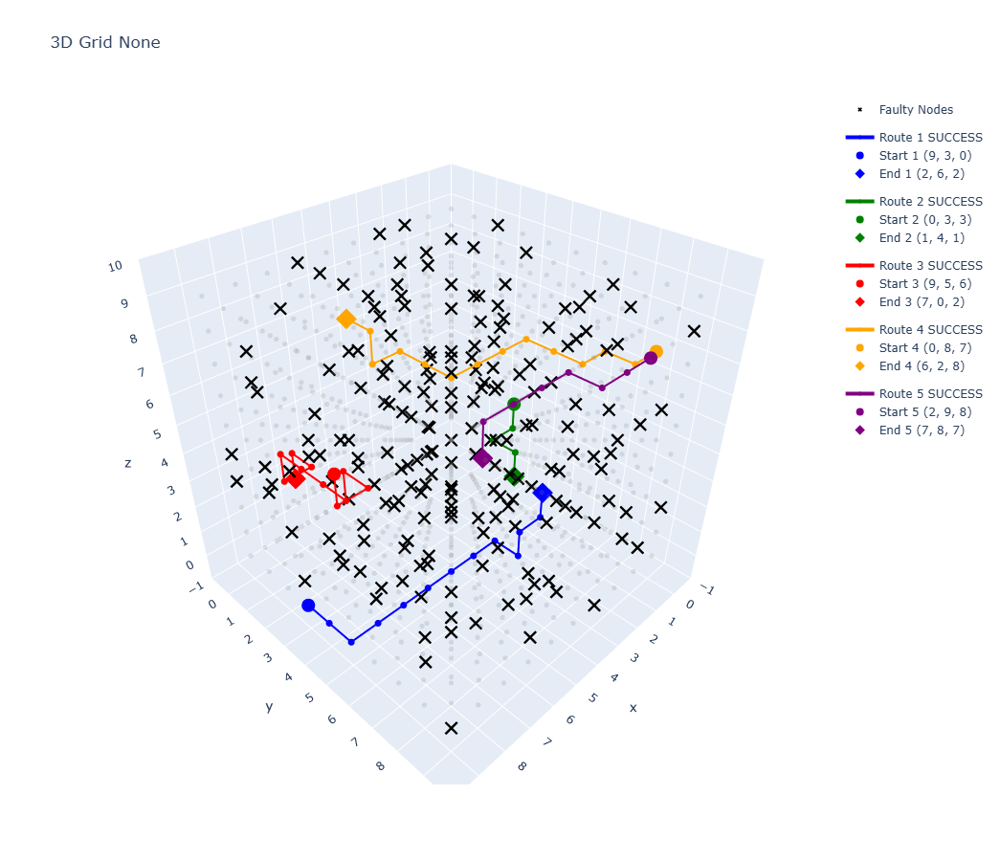

--------------------------------------------------------------------------------

📊 Fault %: 21% | Run: 1 | 🧬 Seed: 940610
Route 1:
  Start Node:          (9, 3, 0)
  End Node:            (2, 6, 2)
  Manhattan Distance:  12
  Real Distance:       9
  Status:              FAILED
  Failure Point:       (3, 4, 2)
  Reason:              Следующая точка (3, 4, 2) уже была посещена
  Fault Nodes Number:  207
  Fault Nodes:         [(0, 0, 7), (0, 2, 7), (0, 2, 9), (0, 3, 1), (0, 3, 7), (0, 3, 8), (0, 4, 3), (0, 5, 0), (0, 5, 3), (0, 5, 8), (0, 6, 6), (0, 7, 6), (0, 7, 9), (0, 8, 5), (0, 9, 3), (1, 0, 0), (1, 0, 3), (1, 0, 5), (1, 1, 0), (1, 1, 1), (1, 1, 8), (1, 1, 9), (1, 3, 8), (1, 4, 0), (1, 5, 0), (1, 5, 4), (1, 5, 5), (1, 6, 2), (1, 6, 5), (1, 7, 0), (1, 7, 1), (1, 7, 4), (1, 7, 8), (1, 8, 1), (1, 8, 7), (1, 9, 2), (2, 0, 3), (2, 1, 1), (2, 2, 3), (2, 2, 7), (2, 3, 4), (2, 3, 9), (2, 4, 4), (2, 4, 9), (2, 5, 2), (2, 5, 3), (2, 5, 8), (2, 6, 5), (2, 7, 3), (2, 7, 4), (2, 7, 7), (2, 8, 0)

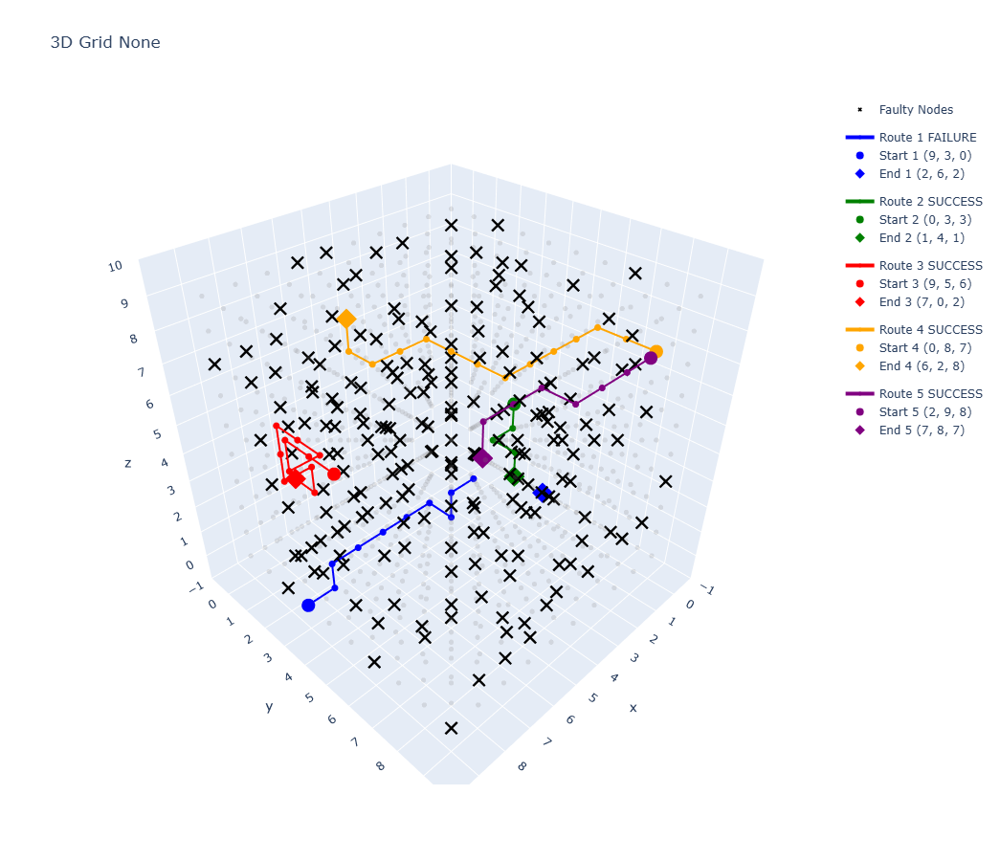

--------------------------------------------------------------------------------

📊 Fault %: 22% | Run: 1 | 🧬 Seed: 520810
Route 1:
  Start Node:          (9, 3, 0)
  End Node:            (2, 6, 2)
  Manhattan Distance:  12
  Real Distance:       12
  Status:              SUCCESS
  Fault Nodes Number:  217
  Fault Nodes:         [(0, 1, 1), (0, 1, 2), (0, 1, 4), (0, 2, 0), (0, 2, 4), (0, 2, 9), (0, 4, 7), (0, 4, 8), (0, 5, 3), (0, 6, 2), (0, 6, 4), (0, 7, 3), (0, 8, 0), (0, 9, 2), (0, 9, 9), (1, 0, 4), (1, 0, 7), (1, 0, 8), (1, 1, 2), (1, 1, 4), (1, 1, 8), (1, 2, 1), (1, 2, 9), (1, 3, 1), (1, 3, 5), (1, 3, 9), (1, 4, 2), (1, 4, 7), (1, 5, 5), (1, 5, 6), (1, 5, 8), (1, 6, 3), (1, 6, 5), (1, 6, 6), (1, 6, 7), (1, 7, 8), (1, 8, 3), (1, 8, 4), (1, 9, 0), (1, 9, 1), (1, 9, 9), (2, 0, 2), (2, 0, 4), (2, 0, 6), (2, 2, 3), (2, 2, 8), (2, 3, 2), (2, 3, 4), (2, 4, 1), (2, 4, 2), (2, 4, 3), (2, 5, 8), (2, 6, 5), (2, 6, 7), (2, 7, 2), (2, 7, 4), (2, 7, 9), (2, 8, 5), (2, 9, 5), (3, 0, 4), (3, 0, 7

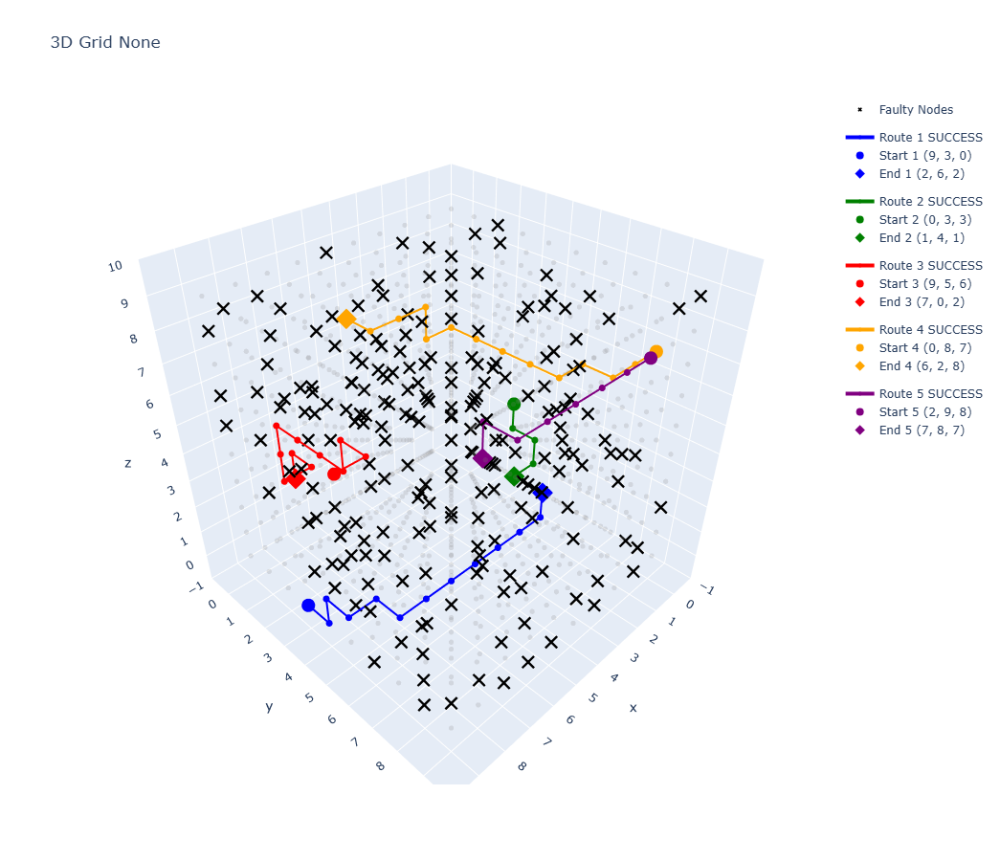

--------------------------------------------------------------------------------

📊 Fault %: 23% | Run: 1 | 🧬 Seed: 200651
Route 1:
  Start Node:          (9, 3, 0)
  End Node:            (2, 6, 2)
  Manhattan Distance:  12
  Real Distance:       12
  Status:              SUCCESS
  Fault Nodes Number:  227
  Fault Nodes:         [(0, 0, 9), (0, 1, 0), (0, 1, 1), (0, 1, 6), (0, 2, 7), (0, 2, 8), (0, 4, 0), (0, 4, 1), (0, 4, 2), (0, 5, 0), (0, 6, 1), (0, 6, 5), (0, 6, 7), (0, 7, 7), (0, 7, 8), (0, 8, 1), (0, 8, 4), (0, 8, 6), (0, 9, 5), (0, 9, 8), (1, 0, 0), (1, 0, 5), (1, 1, 7), (1, 1, 8), (1, 1, 9), (1, 3, 5), (1, 4, 3), (1, 4, 4), (1, 4, 5), (1, 4, 6), (1, 5, 7), (1, 5, 9), (1, 6, 2), (1, 6, 6), (1, 6, 7), (1, 6, 9), (1, 7, 3), (1, 7, 4), (1, 7, 6), (1, 8, 1), (1, 8, 2), (1, 8, 3), (1, 8, 8), (1, 9, 0), (1, 9, 1), (2, 0, 0), (2, 0, 2), (2, 0, 4), (2, 0, 5), (2, 0, 7), (2, 0, 8), (2, 1, 0), (2, 1, 9), (2, 2, 0), (2, 2, 5), (2, 2, 7), (2, 3, 9), (2, 4, 6), (2, 5, 6), (2, 5, 7), (2, 5, 8

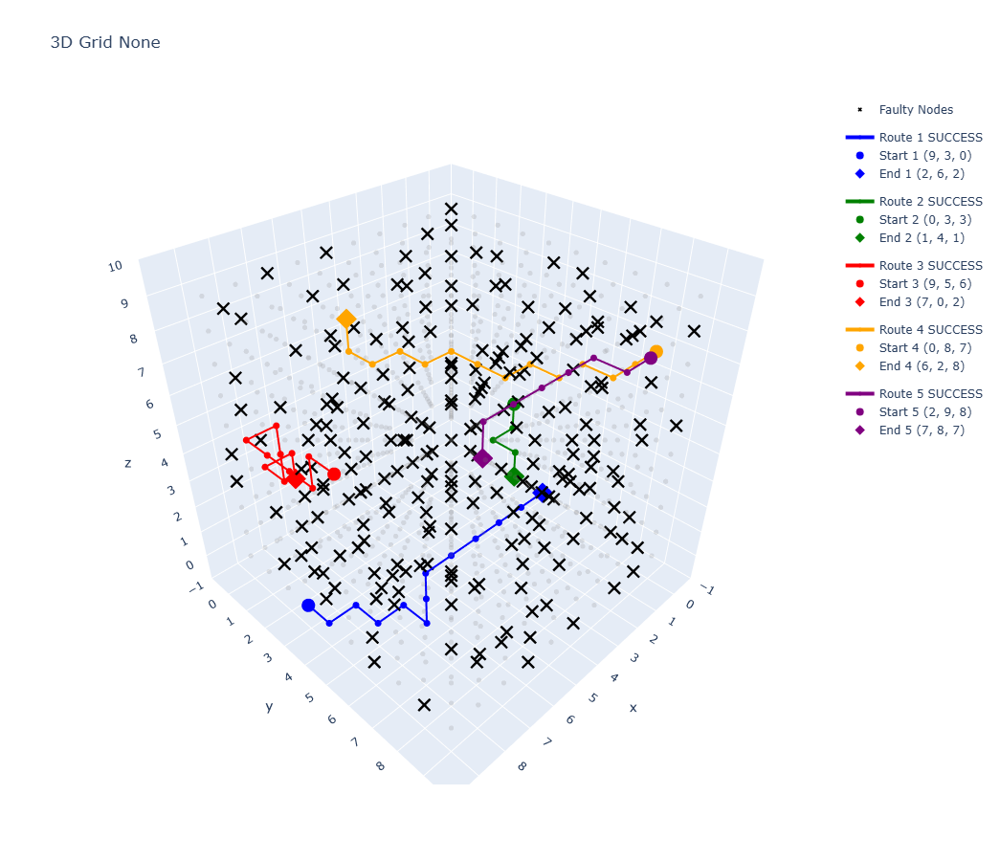

--------------------------------------------------------------------------------

📊 Fault %: 24% | Run: 1 | 🧬 Seed: 137221
Route 1:
  Start Node:          (9, 3, 0)
  End Node:            (2, 6, 2)
  Manhattan Distance:  12
  Real Distance:       14
  Status:              SUCCESS
  Fault Nodes Number:  237
  Fault Nodes:         [(0, 0, 2), (0, 1, 5), (0, 1, 6), (0, 1, 9), (0, 2, 1), (0, 2, 8), (0, 3, 5), (0, 3, 7), (0, 4, 1), (0, 4, 2), (0, 4, 5), (0, 4, 6), (0, 4, 7), (0, 4, 8), (0, 5, 2), (0, 5, 5), (0, 5, 7), (0, 5, 8), (0, 6, 0), (0, 6, 3), (0, 6, 5), (0, 6, 6), (0, 6, 7), (0, 7, 2), (0, 8, 5), (0, 8, 8), (0, 8, 9), (0, 9, 7), (1, 0, 0), (1, 1, 0), (1, 1, 8), (1, 2, 9), (1, 3, 4), (1, 3, 6), (1, 4, 4), (1, 4, 7), (1, 4, 9), (1, 5, 1), (1, 5, 4), (1, 5, 5), (1, 5, 6), (1, 6, 0), (1, 6, 5), (1, 6, 7), (1, 6, 9), (1, 7, 1), (1, 7, 5), (1, 7, 6), (1, 8, 3), (1, 8, 5), (1, 8, 8), (1, 9, 6), (1, 9, 9), (2, 0, 0), (2, 0, 6), (2, 0, 8), (2, 1, 5), (2, 2, 0), (2, 2, 4), (2, 2, 5), (2, 3, 8

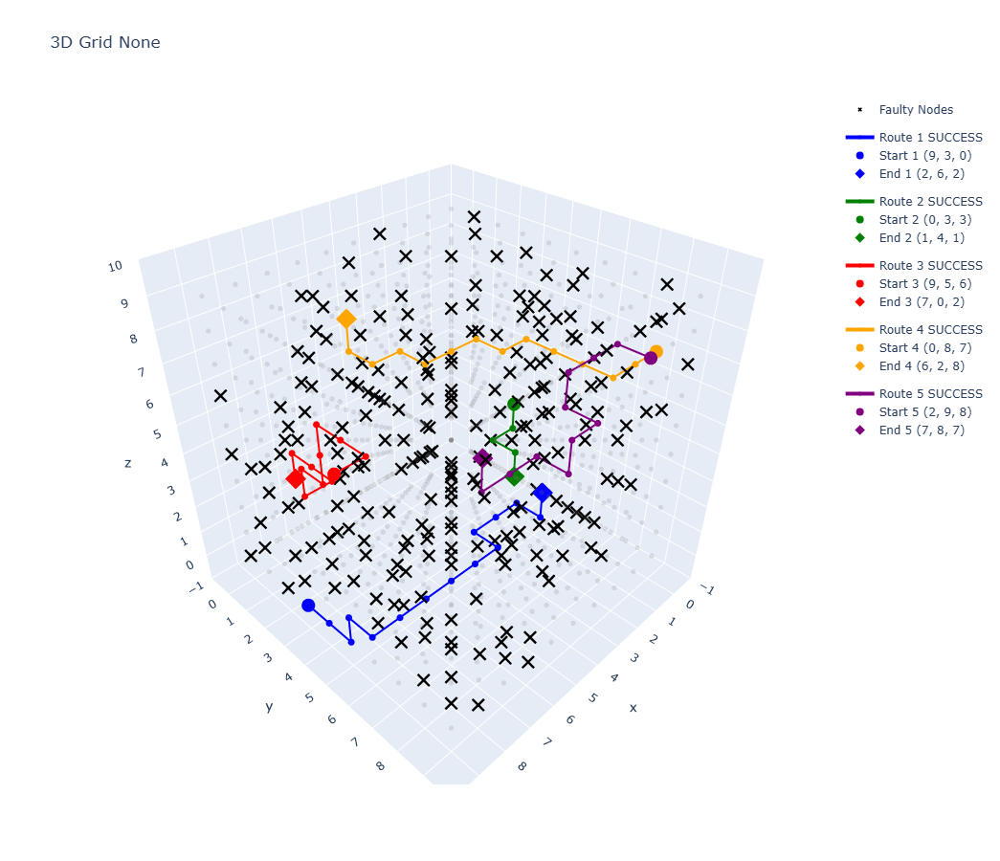


Детализация по маршрутам (колонки — маршруты):
+-----------+-------+-----------------------------------+----------------------------------+-----------------------------------+-----------------------------------+----------------------------------+
| Fault %   | Run   | Route 1 Real Distance (MD = 12)   |   Route 2 Real Distance (MD = 4) |   Route 3 Real Distance (MD = 11) |   Route 4 Real Distance (MD = 13) |   Route 5 Real Distance (MD = 7) |
+===========+=======+===================================+==================================+===================================+===================================+==================================+
| 20%       | Run 1 | 12                                |                                4 |                                11 |                                13 |                                7 |
+-----------+-------+-----------------------------------+----------------------------------+-----------------------------------+------------------------

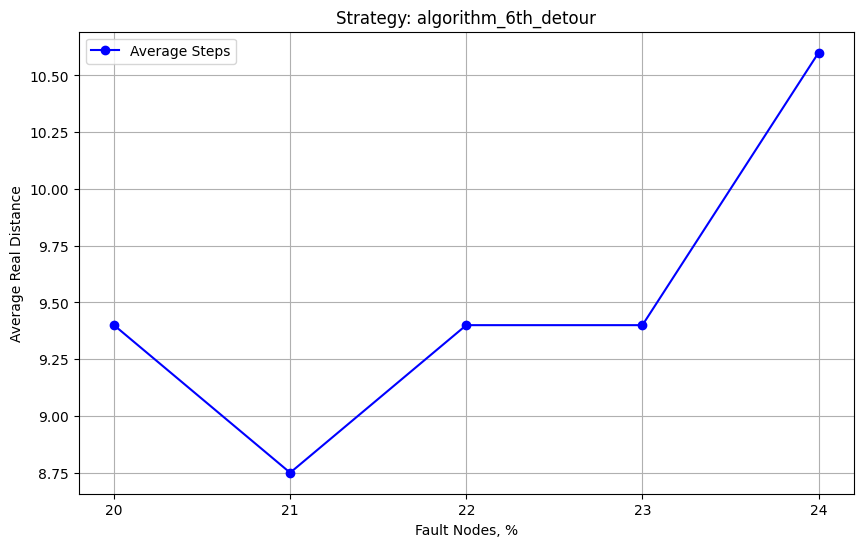


🔁 Reproducible Experiment Seed: 360114

⏱ Время выполнения: 0.62 секунд


In [6]:
run_full_experiment_by_seed(
    seed=360114,
    strategy="algorithm_6th_detour",  # можно "algorithm_1st_xyz" ; "algorithm_2nd_random" ; "algorithm_3rd_smart" ; "algorithm_4th_safe"; "algorithm_5th_safe_optimized"; "algorithm_6th_detour"
    enable_visualization=True,
    grid_size=10,
    N=5,
    fault_range=range(20, 25, 1),
    runs_per_fault=1
)

TESTING
BENCHMARKS

In [7]:
# Настраиваем логирование
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)

def generate_line_start_end(grid_size: int) -> Tuple[Tuple[int, int, int], Tuple[int, int, int]]:
    """
    Генерирует пару координат (start, end) в 3D-сетке заданного размера,
    где конечная точка отличается от начальной по ровно одной координате.

    Параметры:
    -----------
    grid_size : int
        Размер стороны кубической сетки (от 0 до grid_size-1 по каждой координате).

    Возвращает:
    -----------
    Tuple[Tuple[int, int, int], Tuple[int, int, int]]
        Кортеж из двух точек (start, end), где каждая — кортеж из трёх целых чисел.
        Конечная точка отличается от начальной по ровно одной координате и не совпадает с ней.
    """
    # Генерируем случайную точку начала
    start = tuple(random.randint(0, grid_size-1) for _ in range(3))

    # Генерируем конечную точку с изменением только по одной координате
    # Добавляем проверку на совпадение точек
    while True:
        diff_axis = random.randint(0, 2)
        end = list(start)
        end[diff_axis] = random.randint(0, grid_size-1)
        end = tuple(end)

        # Проверяем, что точки не совпадают
        if end != start:
            break

    return start, end

def generate_min_radius_start_end(grid_size: int, min_radius: float = 1.0) -> Tuple[Tuple[int, int, int], Tuple[int, int, int]]:
    """
    Генерирует пару координат (start, end) в 3D-сетке заданного размера,
    где конечная точка отличается от начальной и находится на расстоянии не менее min_radius.

    Параметры:
    -----------
    grid_size : int
        Размер стороны кубической сетки (от 0 до grid_size-1 по каждой координате).
    min_radius : float, optional (default=1.0)
        Минимальное евклидово расстояние между начальной и конечной точками.

    Возвращает:
    -----------
    Tuple[Tuple[int, int, int], Tuple[int, int, int]]
        Кортеж из двух точек (start, end), где каждая — кортеж из трёх целых чисел.
        Конечная точка гарантированно находится на расстоянии не менее min_radius от начальной.
    """
    # Генерируем случайную точку начала
    start = tuple(random.randint(0, grid_size-1) for _ in range(3))

    # Генерируем конечную точку с учетом минимального радиуса
    while True:
        end = tuple(random.randint(0, grid_size-1) for _ in range(3))

        # Проверяем, что точки не совпадают и соблюдается минимальный радиус
        if end != start and euclidean_distance_3d(start, end) >= min_radius:
            break

    return start, end

def euclidean_distance_3d(point1: Tuple[int, int, int], point2: Tuple[int, int, int]) -> float:
    """
    Вычисляет евклидово расстояние между двумя точками в 3D пространстве.

    Параметры:
    -----------
    point1 : Tuple[int, int, int]
        Первая точка (x, y, z).
    point2 : Tuple[int, int, int]
        Вторая точка (x, y, z).

    Возвращает:
    -----------
    float
        Евклидово расстояние между point1 и point2.
    """
    return math.sqrt(
        (point1[0] - point2[0]) ** 2 +
        (point1[1] - point2[1]) ** 2 +
        (point1[2] - point2[2]) ** 2
    )

def generate_start_end_with_min_distance(
    grid_size: int,
    min_distance: int = 3
) -> Tuple[Tuple[int, int, int], Tuple[int, int, int]]:
    """
    Генерирует пару точек (start, end) в 3D-сетке заданного размера,
    где точки отличаются по одной оси не менее чем на min_distance.

    Параметры:
    -----------
    grid_size : int
        Размер кубической сетки (координаты от 0 до grid_size-1).
    min_distance : int, optional (default=3)
        Минимально допустимое расстояние по выбранной оси между стартовой и конечной точками.
        Должно быть меньше grid_size.

    Возвращает:
    -----------
    Tuple[Tuple[int, int, int], Tuple[int, int, int]]
        Кортеж из стартовой и конечной точек, где каждая точка — кортеж из трёх координат.
        Отличие между точками гарантировано по одной координате не менее min_distance.
    """
    assert min_distance < grid_size, "min_distance должно быть меньше размера сетки"

    # Выбираем ось, вдоль которой будет обеспечена дельта
    axis = random.choice([0, 1, 2])

    # Стартовая точка
    start = [
        random.randint(0, grid_size - 1),
        random.randint(0, grid_size - 1),
        random.randint(0, grid_size - 1)
    ]

    axis_start = start[axis]

    # Все возможные значения конечной координаты, удовлетворяющие условию
    possible_positions = [
        i for i in range(grid_size)
        if abs(i - axis_start) >= min_distance
    ]

    axis_end = random.choice(possible_positions)

    # Создаём конечную точку на основе стартовой
    end = start.copy()
    end[axis] = axis_end

    return tuple(start), tuple(end)

def run_test(
    start: Tuple[int, int, int],
    end: Tuple[int, int, int],
    failed_nodes: Set[Tuple[int, int, int]],
    grid_size: int,
    enable_visualization: bool = True,
    verbose: bool = True,
    strategies: Optional[List[str]] = None
) -> List[Dict]:
    """
    Запускает серию тестов маршрутизации на заданном 3D-сеточном пространстве
    с различными стратегиями маршрутизации.

    Параметры:
    -----------
    start : Tuple[int, int, int]
        Начальная точка маршрута в 3D сетке.
    end : Tuple[int, int, int]
        Конечная точка маршрута в 3D сетке.
    failed_nodes : Set[Tuple[int, int, int]]
        Множество координат отказавших узлов, которых нужно избегать.
    grid_size : int
        Размер кубической сетки (grid_size x grid_size x grid_size).
    enable_visualization : bool, optional (default=True)
        Флаг для отображения визуализации маршрутов после выполнения каждого теста.
    verbose : bool, optional (default=True)
        Флаг для вывода подробной информации о результатах теста.
    strategies : Optional[List[str]], optional
        Список используемых стратегий маршрутизации. Если не указан, используются все.

    Возвращает:
    -----------
    List[Dict]
        Список словарей с результатами тестов по каждой стратегии.
        Каждый словарь содержит ключи: "strategy", "start", "end", "grid_size",
        "fault_nodes_count", "path", "status", "reason", "distance", "manhattan_distance".
    """

    if strategies is None:
        strategies = [
            "algorithm_1st_xyz",
            "algorithm_2nd_random",
            "algorithm_3rd_smart",
            "algorithm_4th_safe",
            "algorithm_5th_safe_optimized"
        ]

    results = []

    for strategy in strategies:
        start_time = time.perf_counter()   # <<-- замер перед запуском
        #logging.info(f"Тестирование стратегии: {strategy}")
        path, status, reason = build_route_3d(
            start, end, failed_nodes,
            grid_size=(grid_size, grid_size, grid_size),
            strategy=strategy
        )
        end_time = time.perf_counter()
        elapsed = (end_time - start_time) * 1000  # миллисекунды
        
        result = {
            "strategy": strategy,
            "start": start,
            "end": end,
            "grid_size": grid_size,
            "failed_nodes":failed_nodes,
            "fault_nodes_count": len(failed_nodes),
            "fault_nodes_%": f"{round((len(failed_nodes)) / (grid_size**3 - 2) * 100, 2)}%",
            "path": path,
            "status": status,
            "reason": reason,
            "distance": len(path) - 1,
            "manhattan_distance": manhattan_distance_3d(start, end),
            "time": elapsed   # <<-- добавляем время каждой стратегии
        }

        if verbose:
            print(f"\nРезультаты для стратегии: {result['strategy']}")
            print(f"\nStart: {result['start']}")
            print(f"\nEnd: {result['end']}")
            print(f"\nРазмер сетки: {result['grid_size']}")
            print(f"\nFault Nodes: {result['failed_nodes']}")
            print(f"\nFault Nodes Count: {result['fault_nodes_count']}")
            print(f"\nFault Nodes %: {result['fault_nodes_%']}")
            print(f"Статус: {result['status']}")
            print(f"Причина: {result['reason']}")
            print(f"Пройденное расстояние: {result['distance']}")
            print(f"Манхэттенское расстояние: {result['manhattan_distance']}")
            print(f"Путь: {result['path']}"),
            print(f"Время: {elapsed:.15f}с")

        results.append(result)

        if enable_visualization:
            plot_multiple_routes_3d([(path, start, end)], failed_nodes, (grid_size, grid_size, grid_size), strategy)

    return results

БЛОК А

In [8]:
def test_case_A01(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Маршрут по прямой линии в 3D сетке без отказавших узлов.

    Генерирует случайные начальную и конечную точки, которые отличаются только по одной координате.
    В сетке отсутствуют отказавшие узлы.

    Параметры:
    -----------
    grid_size : int
        Размер кубической сетки.
    enable_visualization : bool
        Флаг отображения визуализации маршрута.
    verbose : bool
        Флаг вывода подробной информации.
    strategies : List[str] или None
        Список алгоритмов маршрутизации для тестирования.

    Возвращает:
    -----------
    Результат выполнения run_test для заданных параметров.
    """

    start, end = generate_line_start_end(grid_size)  # Случайные начальная и конечная точки
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies=strategies)

def test_case_A02(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Маршрут от (0,0,0) до противоположного угла сетки без отказавших узлов.

    Начальная точка — (0,0,0), конечная — (grid_size-1, grid_size-1, grid_size-1).
    Отказавших узлов нет.

    Параметры и возвращаемое значение аналогичны test_case_A01.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, grid_size - 1, grid_size - 1)  # Конечная точка в противоположном углу
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_A03(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Маршрут от противоположного угла сетки (grid_size-1, grid_size-1, grid_size-1) до (0,0,0).

    Отказавших узлов нет.

    Параметры и возвращаемое значение аналогичны test_case_A01.
    """

    start = (grid_size - 1, grid_size - 1, grid_size - 1)  # Начальная точка в противоположном углу
    end = (0, 0, 0)  # Конечная точка в начале координат
    failed_nodes = {}  # Нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_A04(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Маршрут с ограничением — вокруг начальной точки все 6 соседних узлов помечены как отказавшие.

    Генерирует случайные начальную и конечную точки с минимальным расстоянием 2 между ними.
    Все ортогональные соседи начальной точки считаются отказавшими узлами (недоступны для маршрутизации).

    Параметры и возвращаемое значение аналогичны test_case_A01.
    """

    start, end = generate_min_radius_start_end(grid_size, 2)  # Случайные начальная и конечная точки

    # Только ортогональные соседи старта (6 направлений)
    directions = [(-1, 0, 0), (1, 0, 0),
                  (0, -1, 0), (0, 1, 0),
                  (0, 0, -1), (0, 0, 1)]

    failed_nodes = set()
    for dx, dy, dz in directions:
        x, y, z = start[0] + dx, start[1] + dy, start[2] + dz
        if 0 <= x < grid_size and 0 <= y < grid_size and 0 <= z < grid_size:
            failed_nodes.add((x, y, z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

БЛОК B

In [9]:
def test_case_B01(grid_size: int = 10, fault_rate: float = 0.0, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Случайные отказавшие узлы в 3D-сетке.

    - Случайное распределение отказавших узлов по всей сетке согласно заданному проценту отказов.
    - Старт и конец генерируются случайно с минимальным радиусом 3.
    - Проверяется маршрутизация с учётом отказов.

    Параметры:
        grid_size: размер сетки по каждой оси (кубическая сетка).
        fault_rate: доля отказавших узлов в сетке (0.0–1.0).
        enable_visualization: флаг визуализации маршрута.
        verbose: подробный вывод.
        strategies: список алгоритмов маршрутизации.

    Возвращает:
        Результат работы run_test с указанными параметрами.
    """
    total_nodes = grid_size ** 3
    num_failures = int(total_nodes * fault_rate)

    all_nodes = [(x, y, z) for x in range(grid_size) for y in range(grid_size) for z in range(grid_size)]
    failed_nodes = set(random.sample(all_nodes, num_failures))

    start, end = generate_min_radius_start_end(grid_size, 3)

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B02(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Отказавший узел на прямой между стартом и концом.

    - Генерируется старт и конец с минимальным расстоянием.
    - Определяется ось с максимальной разницей координат.
    - Вдоль этой оси выбирается случайный отказавший узел между стартом и концом.
    - Проверяется маршрутизация, учитывая этот отказ.

    Параметры и возвращаемое значение аналогичны тесту B01.
    """
    min_distance = 3

    # Генерируем старт и конец с минимальным расстоянием
    start, end = generate_start_end_with_min_distance(grid_size, min_distance)

    # Определяем ось с максимальной дельтой
    deltas = {
        'x': abs(start[0] - end[0]),
        'y': abs(start[1] - end[1]),
        'z': abs(start[2] - end[2])
    }
    axis = max(deltas, key=deltas.get)

    # Получаем координаты узлов на прямой по выбранной оси
    line_nodes = []
    fixed_coords = [start[0], start[1], start[2]]

    axis_index = {'x': 0, 'y':1, 'z':2}[axis]
    start_coord = start[axis_index]
    end_coord = end[axis_index]

    # Направление
    step = 1 if end_coord > start_coord else -1

    for coord in range(start_coord + step, end_coord, step):
        node = list(fixed_coords)
        node[axis_index] = coord
        line_nodes.append(tuple(node))

    if not line_nodes:
        # Если нет промежуточных точек, то сбойный узел ставим рядом (по оси с максимальной дельтой)
        # Чтобы не встать на старт или конец, сдвинем start_coord на +1 или -1 в зависимости от направления
        faulty_node_coord = start_coord + step
        faulty_node = list(fixed_coords)
        faulty_node[axis_index] = faulty_node_coord
        failed_nodes = {tuple(faulty_node)}
    else:
        # Выбираем случайный узел на прямой, кроме старт и конец
        faulty_node = random.choice(line_nodes)
        failed_nodes = {faulty_node}

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B03(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Отказавшие узлы — соседи конечной точки.

    - Старт и конец с минимальным расстоянием 2.
    - Отказавшие узлы — все ортогональные соседи конечной точки.
    - Проверяется возможность добраться до конца с такими отказами.

    Параметры и возвращаемое значение аналогичны тесту B01.
    """

    start, end = generate_min_radius_start_end(grid_size, 2)  # Случайные начальная и конечная точки

    # Создаем отказавшие узлы: только ортогональные соседи конечной точки
    directions = [(-1, 0, 0), (1, 0, 0),
                  (0, -1, 0), (0, 1, 0),
                  (0, 0, -1), (0, 0, 1)]

    failed_nodes = set()
    for dx, dy, dz in directions:
        x, y, z = end[0] + dx, end[1] + dy, end[2] + dz
        if 0 <= x < grid_size and 0 <= y < grid_size and 0 <= z < grid_size:
            failed_nodes.add((x, y, z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B04(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Отказавшие узлы — соседи конечной точки, кроме одного рабочего в плоскости.

    - Аналогично B03, но из отказавших соседей убирается один узел,
      лежащий в плоскости, выбранной случайно.
    - Это создаёт «рабочий проход» рядом с конечной точкой.

    Параметры и возвращаемое значение аналогичны тесту B01.
    """

    start, end = generate_min_radius_start_end(grid_size, 2)  # Случайные начальная и конечная точки

    # Создаем отказавшие узлы: только ортогональные соседи конечной точки
    directions = [(-1, 0, 0), (1, 0, 0),
                  (0, -1, 0), (0, 1, 0),
                  (0, 0, -1), (0, 0, 1)]

    failed_nodes = set()
    for dx, dy, dz in directions:
        x, y, z = end[0] + dx, end[1] + dy, end[2] + dz
        if 0 <= x < grid_size and 0 <= y < grid_size and 0 <= z < grid_size:
            failed_nodes.add((x, y, z))

    # Определяем, какие плоскости не совпадают с глобальными
    valid_planes = []
    if end[0] != 0 and end[0] != grid_size - 1:
        valid_planes.append('x')
    if end[1] != 0 and end[1] != grid_size - 1:
        valid_planes.append('y')
    if end[2] != 0 and end[2] != grid_size - 1:
        valid_planes.append('z')

    # Случайным образом выбираем одну из допустимых плоскостей
    if valid_planes:
        plane = random.choice(valid_planes)
    else:
        # Если все плоскости глобальные, выбираем любую
        plane = random.choice(['x', 'y', 'z'])

    # Выбираем случайный рабочий узел в середине выбранной плоскости
    if plane == 'x':
        working_node = (end[0]-1, end[1], end[2])
    elif plane == 'y':
        working_node = (end[0], end[1]-1, end[2])
    else:  # plane == 'z'
        working_node = (end[0], end[1], end[2]-1)

    # Проверяем, что выбранный узел действительно существует
    if 0 <= working_node[0] < grid_size and \
       0 <= working_node[1] < grid_size and \
       0 <= working_node[2] < grid_size:
        # Удаляем выбранный рабочий узел из списка отказавших
        failed_nodes.discard(working_node)

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B05(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, barrier_between_points: bool = False, strategies: List[str] = None):
    """
    Линейный барьер отказавших узлов.

    - Создаётся барьер отказов по одной оси, либо произвольно по сетке,
      либо между стартом и концом.
    - Барьер гарантированно не включает старт и конец.
    - Проверяется возможность обхода такого барьера.

    Параметры:
        barrier_between_points — если True, барьер создаётся между стартом и концом.

    Остальные параметры и возвращаемое значение как в B01.
    """

    start, end = generate_min_radius_start_end(grid_size, 2)  # Случайные начальная и конечная точки

    # Создаем барьер с проверкой на пересечение с начальной/конечной точками
    failed_nodes = set()
    valid_barrier = False

    while not valid_barrier:
        # Определяем, вдоль какой оси будем создавать линейный барьер
        axis = random.choice(['x', 'y', 'z'])

        # Создаем линейный барьер вдоль выбранной оси
        if barrier_between_points:
            # Создаем барьер только между начальной и конечной точками
            if axis == 'x':
                barrier_x = random.randint(min(start[0], end[0]), max(start[0], end[0]))
                for y in range(grid_size):
                    for z in range(grid_size):
                        failed_nodes.add((barrier_x, y, z))
            elif axis == 'y':
                barrier_y = random.randint(min(start[1], end[1]), max(start[1], end[1]))
                for x in range(grid_size):
                    for z in range(grid_size):
                        failed_nodes.add((x, barrier_y, z))
            else:
                barrier_z = random.randint(min(start[2], end[2]), max(start[2], end[2]))
                for x in range(grid_size):
                    for y in range(grid_size):
                        failed_nodes.add((x, y, barrier_z))
        else:
            # Создаем барьер в любом месте сетки
            if axis == 'x':
                barrier_x = random.randint(1, grid_size-1)
                for y in range(grid_size):
                    for z in range(grid_size):
                        failed_nodes.add((barrier_x, y, z))
            elif axis == 'y':
                barrier_y = random.randint(1, grid_size-1)
                for x in range(grid_size):
                    for z in range(grid_size):
                        failed_nodes.add((x, barrier_y, z))
            else:
                barrier_z = random.randint(1, grid_size-1)
                for x in range(grid_size):
                    for y in range(grid_size):
                        failed_nodes.add((x, y, barrier_z))

        # Проверяем, не включает ли барьер начальную или конечную точки
        if start not in failed_nodes and end not in failed_nodes:
            valid_barrier = True
        else:
            # Если включает - очищаем набор и пробуем снова
            failed_nodes.clear()

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)


def test_case_B06(grid_size: int = 10,
                  enable_visualization: bool = True,
                  verbose: bool = True,
                  barrier_between_points: bool = False,
                  strategies: List[str] = None):
    """
    Шахматный линейный барьер отказавших узлов.

    - Аналогичен B05, но барьер создаётся с шахматным расположением отказов.
    - Барьер не включает старт и конец и не лежит на плоскости их координат.

    Остальные параметры и возвращаемое значение аналогичны тесту B05.
    """
    # Создаем барьер с проверкой на пересечение с начальной/конечной точками
    failed_nodes = set()
    valid_barrier = False
    attempts = 0  # Добавляем счетчик попыток

    while not valid_barrier and attempts < 100:  # Ограничиваем количество попыток
        attempts += 1
        failed_nodes.clear()  # Очищаем набор перед новой попыткой

        # Генерируем начальную и конечную точки
        start, end = generate_min_radius_start_end(grid_size, 2)

        # Определяем, вдоль какой оси будем создавать барьер
        axis = random.choice(['x', 'y', 'z'])

        # Генерируем шахматную последовательность сбойных узлов
        if barrier_between_points:
            # Создаем барьер только между начальной и конечной точками
            if axis == 'x':
                barrier_x = random.randint(min(start[0], end[0]), max(start[0], end[0]))
                for y in range(grid_size):
                    for z in range(grid_size):
                        if (y + z) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((barrier_x, y, z))
            elif axis == 'y':
                barrier_y = random.randint(min(start[1], end[1]), max(start[1], end[1]))
                for x in range(grid_size):
                    for z in range(grid_size):
                        if (x + z) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((x, barrier_y, z))
            else:
                barrier_z = random.randint(min(start[2], end[2]), max(start[2], end[2]))
                for x in range(grid_size):
                    for y in range(grid_size):
                        if (x + y) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((x, y, barrier_z))
        else:
            # Создаем барьер в любом месте сетки
            if axis == 'x':
                barrier_x = random.randint(1, grid_size-1)
                for y in range(grid_size):
                    for z in range(grid_size):
                        if (y + z) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((barrier_x, y, z))
            elif axis == 'y':
                barrier_y = random.randint(1, grid_size-1)
                for x in range(grid_size):
                    for z in range(grid_size):
                        if (x + z) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((x, barrier_y, z))
            else:
                barrier_z = random.randint(1, grid_size-1)
                for x in range(grid_size):
                    for y in range(grid_size):
                        if (x + y) % 2 == 0:  # Добавляем шахматную логику
                            failed_nodes.add((x, y, barrier_z))

        # Проверяем, не включает ли барьер начальную или конечную точки
        # И проверяем, что точки не лежат в плоскости барьера
        if start not in failed_nodes and end not in failed_nodes:
            if axis == 'x':
                if start[0] != barrier_x and end[0] != barrier_x:
                    valid_barrier = True
            elif axis == 'y':
                if start[1] != barrier_y and end[1] != barrier_y:
                    valid_barrier = True
            else:
                if start[2] != barrier_z and end[2] != barrier_z:
                    valid_barrier = True
        else:
            # Если включает - очищаем набор и пробуем снова
            failed_nodes.clear()

    if not valid_barrier:
        raise Exception("Не удалось создать валидный барьер после 100 попыток")

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B07(grid_size: int = 10,
                  enable_visualization: bool = True,
                  block_size_x: Optional[int] = None,
                  block_size_y: Optional[int] = None,
                  verbose: bool = True,
                  strategies: List[str] = None):
    """
    Плоский блок отказов в центре сетки.

    - Отказавшие узлы формируют прямоугольный блок на фиксированном уровне по оси Z.
    - Старт и конец генерируются в противоположных квадрантах сетки.
    - Размер блока можно задавать, иначе выбирается случайно.

    Остальные параметры и возвращаемое значение как в B01.
    """
    block_z = grid_size // 2  # уровень с блоком

    # Если размеры блока не заданы, выбираем случайные в диапазоне 3..6
    if block_size_x is None:
        block_size_x = random.randint(3, 6)
    if block_size_y is None:
        block_size_y = random.randint(3, 6)

    # Центр блока
    center_x = grid_size // 2
    center_y = grid_size // 2

    start_x_block = center_x - block_size_x // 2
    start_y_block = center_y - block_size_y // 2

    # Генерация стартовой точки в левом нижнем квадранте (0..3 по x,y,z)
    start = (
        random.randint(0, min(3, grid_size - 1)),
        random.randint(0, min(3, grid_size - 1)),
        random.randint(0, min(3, grid_size - 1))
    )

    # Генерация конечной точки в правом верхнем квадранте (6..9 по x,y,z)
    end = (
        random.randint(max(6, 0), grid_size - 1),
        random.randint(max(6, 0), grid_size - 1),
        random.randint(max(6, 0), grid_size - 1)
    )

    failed_nodes = set()

    # Создаём блок ошибок в центре на уровне block_z с размером block_size_x x block_size_y
    for x in range(start_x_block, start_x_block + block_size_x):
        for y in range(start_y_block, start_y_block + block_size_y):
            if 0 <= x < grid_size and 0 <= y < grid_size:
                failed_nodes.add((x, y, block_z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def point_in_cube(point: Tuple[int, int, int], cube_start: Tuple[int, int, int], K: int) -> bool:
    """
    Проверяет, находится ли точка внутри (или на границе) куба заданного размера K×K×K.

    Параметры:
    -----------
    point : Tuple[int, int, int]
        Координаты проверяемой точки (x, y, z).

    cube_start : Tuple[int, int, int]
        Координаты угла начала куба (x, y, z) — минимальные значения по каждой оси.

    K : int
        Размер стороны куба.

    Возвращает:
    -----------
    bool
        True, если точка находится внутри куба (включая границу), иначе False.
    """
    return all(cube_start[i] <= point[i] <= cube_start[i] + K - 1 for i in range(3))

def test_case_B08(grid_size: int = 10,
                  enable_visualization: bool = True,
                  N: int = 5,
                  K: int = 2,
                  verbose: bool = True,
                  strategies: List[str] = None):
    """
    Несколько кубических блоков отказов, разнесённых в пространстве.

    - Генерируются N кубов отказов размером K×K×K.
    - Кубы не пересекаются и имеют промежуток минимум в 1 узел.
    - Старт и конец не лежат внутри блоков.

    Остальные параметры и возвращаемое значение как в B01.
    """
    # Генерация стартовой точки (левый нижний квадрант)
    start = (
        random.randint(0, min(3, grid_size - 1)),
        random.randint(0, min(3, grid_size - 1)),
        random.randint(0, min(3, grid_size - 1))
    )
    # Генерация конечной точки (правый верхний квадрант)
    end = (
        random.randint(max(6, 0), grid_size - 1),
        random.randint(max(6, 0), grid_size - 1),
        random.randint(max(6, 0), grid_size - 1)
    )

    failed_nodes: Set[Tuple[int, int, int]] = set()
    placed_cubes = []

    max_attempts = 10000
    attempts = 0

    while len(placed_cubes) < N and attempts < max_attempts:
        attempts += 1

        x = random.randint(0, grid_size - K)
        y = random.randint(0, grid_size - K)
        z = random.randint(0, grid_size - K)

        # Проверяем расстояние между кубами >= K + 1 (1 узел "промежуток")
        no_overlap = True
        for (px, py, pz) in placed_cubes:
            if abs(x - px) < K + 1 and abs(y - py) < K + 1 and abs(z - pz) < K + 1:
                no_overlap = False
                break
        if not no_overlap:
            continue

        # Проверяем, что старт и конец не внутри куба
        if point_in_cube(start, (x, y, z), K) or point_in_cube(end, (x, y, z), K):
            continue

        # Добавляем куб в failed_nodes
        for dx in range(K):
            for dy in range(K):
                for dz in range(K):
                    failed_nodes.add((x + dx, y + dy, z + dz))

        placed_cubes.append((x, y, z))

    if len(placed_cubes) < N:
        raise Exception(f"Не удалось разместить все кубы. Размещено: {len(placed_cubes)} из {N}")

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_B09(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Два слоя шахматных отказов на соседних уровнях.

    - Старт и конец с минимальным расстоянием 3.
    - Определяется ось с максимальной дельтой.
    - Создаются два слоя отказов шахматным узором по двум соседним уровням
      вдоль выбранной оси.
    - Проверяется возможность обхода.

    Остальные параметры и возвращаемое значение как в B01.
    """
    min_distance = 3

    # Генерация начальной и конечной точек
    start, end = generate_start_end_with_min_distance(grid_size, min_distance)

    # Определение дельт и выбор оси с максимальной дельтой
    deltas = [abs(start[i] - end[i]) for i in range(3)]
    axis_index = deltas.index(max(deltas))  # 0=x, 1=y, 2=z

    coord_start = start[axis_index]
    coord_end = end[axis_index]
    coord_min, coord_max = min(coord_start, coord_end), max(coord_start, coord_end)

    # Выбираем уровень для первого слоя с гарантией, что старт и энд не на этом уровне
    possible_levels = [lvl for lvl in range(coord_min, coord_max + 1)
                       if lvl != coord_start and lvl != coord_end]

    if not possible_levels:
        # Если все уровни заняты, просто берем coord_min (крайний случай)
        level = coord_min
    else:
        level = random.choice(possible_levels)

    # Второй слой — соседний уровень (если не выходит за границы и не совпадает с старт/энд)
    if level + 1 < grid_size and (level + 1 != coord_start) and (level + 1 != coord_end):
        level_plus_1 = level + 1
    elif level - 1 >= 0 and (level - 1 != coord_start) and (level - 1 != coord_end):
        level_plus_1 = level - 1
    else:
        # Если соседний уровень занят, второй слой на том же уровне (крайний случай)
        level_plus_1 = level

    failed_nodes = set()

    # Два слоя шахматных решёток без сдвига
    for current_level in [level, level_plus_1]:
        for i in range(grid_size):
            for j in range(grid_size):
                if (i + j) % 2 == 0:
                    if axis_index == 0:
                        failed_nodes.add((current_level, i, j))
                    elif axis_index == 1:
                        failed_nodes.add((i, current_level, j))
                    else:
                        failed_nodes.add((i, j, current_level))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)


Блок C

In [10]:
def generate_turning_path(grid_size: int, turns: int, segment_length: int) -> List[Tuple[int, int, int]]:
        """
        Генерирует извилистый путь (туннель) в 3D-сетке с заданным количеством поворотов и длиной сегментов.

        Путь начинается с случайной точки и поворачивает на каждом шаге, исключая повторения направления
        и обратное движение. Все точки маршрута уникальны и находятся внутри сетки.

        Параметры:
        -----------
        grid_size : int
            Размер 3D-сетки. Сетка считается кубической: (grid_size x grid_size x grid_size).

        turns : int
            Количество поворотов в пути. Путь будет состоять из (turns + 1) прямолинейных сегментов.

        segment_length : int
            Длина каждого прямолинейного сегмента между поворотами.

        Возвращает:
        -----------
        List[Tuple[int, int, int]]
            Список точек маршрута в 3D-сетке, представляющих извилистый туннель.

        Исключения:
        -----------
        RuntimeError
            Генерация маршрута не удалась после 100 попыток. Например, если путь выходит за пределы сетки
            или сталкивается с ранее посещёнными точками.
        """
        directions = [(1, 0, 0), (0, 1, 0), (0, 0, 1),
                      (-1, 0, 0), (0, -1, 0), (0, 0, -1)]

        for _ in range(100):  # ограничим попытки
            path = []
            visited = set()
            pos = (
                random.randint(0, grid_size - 1),
                random.randint(0, grid_size - 1),
                random.randint(0, grid_size - 1),
            )
            path.append(pos)
            visited.add(pos)

            prev_dir = None
            success = True

            for _ in range(turns + 1):
                candidates = [
                    d for d in directions if d != prev_dir and tuple(-x for x in d) != prev_dir
                ]
                if not candidates:
                    success = False
                    break
                dir = random.choice(candidates)
                prev_dir = dir

                for _ in range(segment_length):
                    pos = tuple(pos[i] + dir[i] for i in range(3))
                    if not all(0 <= pos[i] < grid_size for i in range(3)) or pos in visited:
                        success = False
                        break
                    path.append(pos)
                    visited.add(pos)

                if not success:
                    break

            if success:
                return path

        raise RuntimeError("Не удалось сгенерировать извилистый туннель")

def test_case_C01(grid_size: int = 10,
                  turns: int = 2,
                  segment_length: int = 3,
                  same_plane: bool = False,
                  enable_visualization: bool = False,
                  verbose: bool = True,
                  strategies: List[str] = None) -> List[Dict]:
    """
    Тест C01: Извилистый туннель с барьерами по бокам. Проверяет прохождение по узкому пути в 3D-сетке,
    окружённому заблокированными соседями.

    Параметры:
    -----------
    grid_size : int, по умолчанию 10
        Размер 3D-сетки (предполагается кубическая сетка размером grid_size × grid_size × grid_size).

    turns : int, по умолчанию 2
        Количество поворотов в пути туннеля.

    segment_length : int, по умолчанию 3
        Длина каждого прямого сегмента между поворотами.

    same_plane : bool, по умолчанию False
        Если True — начальная и конечная точки маршрута должны лежать на одной плоскости (одна из координат одинакова).
        Если False — все координаты начала и конца должны различаться.

    enable_visualization : bool, по умолчанию False
        Визуализировать ли маршрут.

    verbose : bool, по умолчанию True
        Печатать ли дополнительную отладочную информацию.

    strategies : List[str], по умолчанию None
        Список стратегий маршрутизации, которые нужно протестировать.

    Возвращает:
    -----------
    List[Dict]
        Список словарей с результатами маршрутизации для каждой стратегии.
        Каждый словарь содержит информацию о маршруте, статусе, причине завершения и прочее.
    """
    # Попытка с нужным условием same_plane
    for attempt_same_plane in [same_plane, not same_plane]:
        try:
            tunnel_path = generate_turning_path(grid_size, turns, segment_length)
        except RuntimeError:
            tunnel_path = None

        if tunnel_path is None:
            continue

        start = tunnel_path[0]
        end = tunnel_path[-1]

        # Проверяем условие плоскости
        if same_plane:
            if (start[0] == end[0]) or (start[1] == end[1]) or (start[2] == end[2]):
                break  # условие выполнено — выходим из цикла
        else:
            # Для same_plane=False хотим, чтобы все координаты отличались
            if (start[0] != end[0]) and (start[1] != end[1]) and (start[2] != end[2]):
                break  # условие выполнено — выходим из цикла

        # Если условие не выполнено, пытаемся снова
    else:
        print(f"Внимание: не удалось сгенерировать туннель с same_plane={same_plane}, сгенерирован без ограничений.")
        tunnel_path = generate_turning_path(grid_size, turns, segment_length)
        start = tunnel_path[0]
        end = tunnel_path[-1]

    # Формируем failed_nodes — все соседи туннеля, не входящие в него
    tunnel_set = set(tunnel_path)
    failed_nodes = set()
    for node in tunnel_path:
        neighbors = get_neighbors_3d(node, (grid_size, grid_size, grid_size))
        failed_nodes.update(set(neighbors) - tunnel_set)

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)


def test_case_C02(grid_size: int = 10,
                  turns: int = 7,
                  segment_length: int = 3,
                  same_plane: bool = False,
                  enable_visualization: bool = False,
                  verbose: bool = True,
                  strategies: List[str] = None) -> List[Dict]:
    """
    Тест C02: Извилистый туннель с поворотами. Основан на C01, но с другими параметрами:
    большее количество поворотов, сегменты короче, отключено ограничение same_plane.

    Параметры такие же, как у C01. См. описание test_case_C01.
    """

    return test_case_C01(
        grid_size=grid_size,
        turns=turns,
        segment_length=segment_length,
        same_plane=same_plane,
        enable_visualization=enable_visualization,
        verbose=verbose,
        strategies=strategies
    )

def generate_false_branch(
    start_node: Tuple[int, int, int],
    occupied: Set[Tuple[int, int, int]],
    grid_size: int,
    false_branch_length: int,
    directions: List[Tuple[int, int, int]] = None
) -> List[Tuple[int, int, int]]:
    """
    Генерирует тупиковую ветку (ложный путь) длиной false_branch_length, начиная от start_node.
    Направление выбирается случайным образом из доступных (не занятых) направлений.

    :param start_node: координаты узла, от которого начинается ветка
    :param occupied: множество занятых узлов (туннель и уже созданные ветки)
    :param grid_size: размер куба (по каждой оси)
    :param false_branch_length: длина тупиковой ветки
    :param directions: список возможных направлений (если None, используется 6 основных направлений)
    :return: список координат ветки, либо пустой список, если не удалось сгенерировать
    """
    random.shuffle(directions)
    for dir in directions:
        branch = []
        pos = start_node
        success = True
        for _ in range(false_branch_length):
            next_pos = tuple(pos[i] + dir[i] for i in range(3))
            if not all(0 <= next_pos[i] < grid_size for i in range(3)):
                success = False
                break
            if next_pos in occupied:
                success = False
                break
            branch.append(next_pos)
            pos = next_pos
        if success:
            return branch
    return []

def test_case_C03(
    grid_size: int = 10,
    turns: int = 2,
    segment_length: int = 3,
    max_false_branches_per_node: int = 2,  # теперь - всего ложных веток по всему туннелю
    false_branch_length: int = 3,
    enable_visualization: bool = False,
    verbose: bool = True,
    strategies: List[str] = None
) -> List[Dict]:
    """
    Ложные пути (тупики) вокруг основного извилистого туннеля.
    Основной туннель — как в C1. От него отходят боковые тупики — ложные пути.
    Вокруг туннелей соседи не в туннеле — сломаны, остальная сетка проходима.

    :param grid_size: размер куба
    :param turns: количество поворотов в основном туннеле
    :param segment_length: длина сегмента в основном туннеле
    :param max_false_branches_per_node: макс. кол-во тупиковых веток всего по основному туннелю
    :param false_branch_length: длина тупиковых веток
    :param enable_visualization: визуализация маршрута
    :return: результаты run_test
    """

    directions = [(1, 0, 0), (-1, 0, 0),
                  (0, 1, 0), (0, -1, 0),
                  (0, 0, 1), (0, 0, -1)]

    # Генерируем основной туннель
    main_tunnel = generate_turning_path(grid_size, turns, segment_length)
    occupied_nodes = set(main_tunnel)

    false_tunnels = []
    false_branches_left = max_false_branches_per_node  # Счётчик оставшихся ложных веток

    # Перемешиваем узлы, чтобы распределить ложные ветки случайно
    nodes_shuffled = main_tunnel[:]
    random.shuffle(nodes_shuffled)

    for node in nodes_shuffled:
        if false_branches_left <= 0:
            break
        branch = generate_false_branch(node, occupied_nodes, grid_size, false_branch_length, directions)
        if branch:
            false_tunnels.extend(branch)
            occupied_nodes.update(branch)
            false_branches_left -= 1

    # Помечаем как сломанные все соседи туннелей, не входящие в туннель
    failed_nodes = set()
    all_tunnels = set(main_tunnel) | set(false_tunnels)

    for node in all_tunnels:
        neighbors = get_neighbors_3d(node, (grid_size, grid_size, grid_size))
        failed_nodes.update(set(neighbors) - all_tunnels)

    # Начальная и конечная точки — начало и конец основного туннеля
    start = main_tunnel[0]
    end = main_tunnel[-1]

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_C04(
    grid_size: int = 10,
    enable_visualization: bool = False,
    verbose: bool = True,
    strategies: List[str] = None
) -> List[Dict]:
    """
    3D-спиральный путь с «зелеными» узлами на каждом уровне.

    Путь строится как поуровневая квадратная спираль, с постепенным сужением на каждом уровне Z.
    Дополнительно некоторые «зелёные» узлы на верхних уровнях выделяются цветом (для визуализации).

    Сломанные узлы (failed_nodes) включают всех соседей пути, которые не входят в путь,
    а также несколько вручную заданных сломанных узлов для проверки обхода.

    Параметры:
    -----------
    grid_size : int, по умолчанию 10
        Размер кубической 3D-сетки.

    enable_visualization : bool, по умолчанию False
        Включить визуализацию 3D-спирали и сломанных узлов с помощью plotly.

    verbose : bool, по умолчанию True
        Выводить подробную отладочную информацию (не реализовано в данном коде, но обычно используется).

    strategies : List[str], по умолчанию None
        Список стратегий маршрутизации для тестирования.

    Возвращает:
    -----------
    List[Dict]
        Результаты вызова run_test — информация о прохождении маршрута по каждой стратегии.

    """
    path = []
    green_nodes_per_layer = {}

    z = 0
    x_start, y_start = 0, 0
    x_max, y_max = grid_size - 1, grid_size - 1

    x_min_curr, y_min_curr = x_start, y_start
    x_max_curr, y_max_curr = x_max, y_max

    while x_min_curr <= x_max_curr and y_min_curr <= y_max_curr and z < grid_size:
        layer_path = []

        for x in range(x_min_curr, x_max_curr + 1):
            node = (x, y_min_curr, z)
            path.append(node)
            layer_path.append(node)

        for y in range(y_min_curr + 1, y_max_curr):
            node = (x_max_curr, y, z)
            path.append(node)
            layer_path.append(node)

        if z < grid_size - 1:
            up_node_1 = (x_max_curr, y_max_curr - 1, z + 1)
            up_node_2 = (x_max_curr - 1, y_max_curr - 1, z + 1)
            path.append(up_node_1)
            path.append(up_node_2)
            green_nodes_per_layer.setdefault(z + 1, []).extend([up_node_1, up_node_2])
        else:
            break

        for x in range(x_max_curr - 2, x_min_curr - 1, -1):
            node = (x, y_max_curr - 1, z + 1)
            path.append(node)
            green_nodes_per_layer.setdefault(z + 1, []).append(node)

        for y in range(y_max_curr - 2, y_min_curr, -1):
            node = (x_min_curr, y, z + 1)
            path.append(node)
            green_nodes_per_layer.setdefault(z + 1, []).append(node)

        green_nodes_per_layer[z] = layer_path

        x_min_curr += 1
        y_min_curr += 1
        x_max_curr -= 1
        y_max_curr -= 1
        z += 1

    start = (0, 0, 0)
    end = path[-1]
    path = [p for p in path if p != (5, 4, 6)]
    path_set = set(path)

    failed_nodes = set()
    for node in path:
        neighbors = get_neighbors_3d(node, (grid_size, grid_size, grid_size))
        failed_nodes.update(set(neighbors) - path_set)

    manual_fails = [(5, 4, 6), (3, 4, 6), (4, 3, 5), (4, 5, 6), (3, 3, 5), (5, 3, 5)]
    failed_nodes.update(manual_fails)

    neighbors_end = set(get_neighbors_3d(end, (grid_size, grid_size, grid_size)))
    for fn in manual_fails:
        neighbors_end.discard(fn)
    failed_nodes -= neighbors_end

    results = run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

    if enable_visualization:
        fig = go.Figure()

        px, py, pz = zip(*path)
        fig.add_trace(go.Scatter3d(
            x=px, y=py, z=pz,
            mode='lines+markers',
            line=dict(color='red', width=4),
            marker=dict(size=3, color='red'),
            name='Спиральный путь'
        ))

        if failed_nodes:
            fx, fy, fz = zip(*failed_nodes)
            fig.add_trace(go.Scatter3d(
                x=fx, y=fy, z=fz,
                mode='markers',
                marker=dict(size=2, color='gray', opacity=0.5),
                name='Сломанные узлы'
            ))

        # Раскраска живых узлов по слоям
        colors = plotly.colors.qualitative.Plotly
        for i, (layer_z, nodes) in enumerate(sorted(green_nodes_per_layer.items())):
            valid_nodes = [n for n in nodes if n not in failed_nodes]
            if not valid_nodes:
                continue
            gx, gy, gz = zip(*valid_nodes)
            color = colors[i % len(colors)]
            fig.add_trace(go.Scatter3d(
                x=gx, y=gy, z=gz,
                mode='lines+markers',
                line=dict(color=color, width=2),
                marker=dict(size=2.5, color=color),
                name=f'Узлы слоя Z={layer_z}'
            ))

        fig.update_layout(title='C5: 3D Спираль с поуровневой раскраской',
                          scene=dict(xaxis=dict(title='X'),
                                     yaxis=dict(title='Y'),
                                     zaxis=dict(title='Z')),
                          width=900, height=900)
        fig.show()

    return results

def test_case_C05(
    grid_size: int = 10,
    enable_visualization: bool = False,
    verbose: bool = True,
    strategies: List[str] = None
) -> List[Dict]:
    """
    Циклические маршруты в 3D-сетке с построением многослойной спирали.

    Построение:
    -----------
    Формируется поуровневая спираль (кольцо) на каждом уровне Z, с постепенным сужением квадратной области.
    На каждом уровне сохраняются узлы слоя с цветовой маркировкой для визуализации.
    Между слоями добавляются "переходные" узлы, соединяющие соседние слои.

    Сломанные узлы:
    --------------
    - Все соседи узлов пути, которые не входят в путь (blocked nodes).
    - Дополнительно вручную добавлены несколько "сломанных" узлов для усложнения теста.
    - Исключены некоторые соседи конечной точки из множества сломанных.

    Параметры:
    -----------
    grid_size : int, по умолчанию 10
        Размер кубической 3D-сетки.

    enable_visualization : bool, по умолчанию False
        Включает визуализацию маршрута, сломанных узлов и поуровневой раскраски с помощью plotly.

    verbose : bool, по умолчанию True
        Флаг для вывода отладочной информации (может быть использован внутри run_test).

    strategies : List[str], по умолчанию None
        Список стратегий маршрутизации, которые будут протестированы.

    Возвращаемое значение:
    ----------------------
    List[Dict]
        Результаты тестирования маршрутов по каждой стратегии из списка strategies.

    Визуализация:
    -------------
    - Красным отображается путь спирали.
    - Серым — сломанные узлы.
    - Разными цветами — «живые» узлы каждого слоя по Z.

    """
    path = []

    z = 0
    x_start, y_start = 0, 0
    x_max, y_max = grid_size - 1, grid_size - 1

    x_min_curr, y_min_curr = x_start, y_start
    x_max_curr, y_max_curr = x_max, y_max

    green_nodes_per_layer = dict()  # ключ: уровень z, значение: список узлов слоя

    while x_min_curr <= x_max_curr and y_min_curr <= y_max_curr and z < grid_size:
        layer_path = []

        # Полное кольцо
        for x in range(x_min_curr, x_max_curr + 1):
            layer_path.append((x, y_min_curr, z))
        for y in range(y_min_curr + 1, y_max_curr + 1):
            layer_path.append((x_max_curr, y, z))
        for x in range(x_max_curr - 1, x_min_curr - 1, -1):
            layer_path.append((x, y_max_curr, z))
        for y in range(y_max_curr - 1, y_min_curr, -1):
            layer_path.append((x_min_curr, y, z))

        path.extend(layer_path)

        # Сохраняем узлы слоя в словарь
        green_nodes_per_layer[z] = layer_path

        # Переход на следующий уровень
        if z < grid_size - 1:
            up1 = (x_min_curr, y_min_curr + 1, z + 1)
            up2 = (x_min_curr + 1, y_min_curr + 1, z + 1)
            path.append(up1)
            path.append(up2)
            # Добавим переходные узлы на следующий слой к его списку
            green_nodes_per_layer.setdefault(z + 1, []).extend([up1, up2])

        x_min_curr += 1
        y_min_curr += 1
        x_max_curr -= 1
        y_max_curr -= 1
        z += 1

    start = (0, 0, 0)
    end = path[-1]
    path_set = set(path)

    failed_nodes = set()
    for node in path:
        neighbors = get_neighbors_3d(node, (grid_size, grid_size, grid_size))
        failed_nodes.update(set(neighbors) - path_set)

    manual_fails = [(5, 4, 6), (3, 4, 6), (4, 3, 5), (4, 5, 6), (3, 3, 5), (5, 3, 5)]
    failed_nodes.update(manual_fails)

    neighbors_end = set(get_neighbors_3d(end, (grid_size, grid_size, grid_size)))
    for fn in manual_fails:
        neighbors_end.discard(fn)
    failed_nodes -= neighbors_end

    results = run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

    if enable_visualization:
        fig = go.Figure()

        # Красный путь
        px, py, pz = zip(*path)
        fig.add_trace(go.Scatter3d(
            x=px, y=py, z=pz,
            mode='lines+markers',
            line=dict(color='red', width=4),
            marker=dict(size=3, color='red'),
            name='Маршрут спирали'
        ))

        # Серые сломанные узлы
        if failed_nodes:
            fx, fy, fz = zip(*failed_nodes)
            fig.add_trace(go.Scatter3d(
                x=fx, y=fy, z=fz,
                mode='markers',
                marker=dict(size=2, color='gray', opacity=0.5),
                name='Сломанные узлы'
            ))

        # Палитра цветов для слоёв
        colors = plotly.colors.qualitative.Plotly

        # Для каждого слоя свои живые узлы зелёным цветом
        for i, (layer_z, nodes) in enumerate(sorted(green_nodes_per_layer.items())):
            # Фильтруем только живые узлы (не сломанные)
            valid_nodes = [n for n in nodes if n not in failed_nodes]
            if not valid_nodes:
                continue
            gx, gy, gz = zip(*valid_nodes)
            color = colors[i % len(colors)]
            fig.add_trace(go.Scatter3d(
                x=gx, y=gy, z=gz,
                mode='lines+markers',
                line=dict(color=color, width=3),
                marker=dict(size=3, color=color),
                name=f'Узлы слоя Z={layer_z}'
            ))

        fig.update_layout(title='C6: Циклические маршруты с раскраской по слоям',
                          scene=dict(xaxis=dict(title='X'),
                                     yaxis=dict(title='Y'),
                                     zaxis=dict(title='Z')),
                          width=900, height=900)
        fig.show()

    return results
def test_case_C06(
    grid_size: int = 10,
    turns: int = 2,
    segment_length: int = 3,
    max_false_branches_near_start: int = 2,
    false_branch_length: int = 3,
    enable_visualization: bool = False,
    verbose: bool = True,
    strategies: List[str] = None
) -> List[Dict]:
    """
    Извилистый туннель с ложными тупиками, отходящими только около начальной точки.

    Основной туннель создаётся аналогично тесту C1 (извилистый путь с поворотами и сегментами).
    Ложные ветки (тупики) создаются только около начального узла основного туннеля или его соседей,
    чтобы смоделировать запутанную область у старта.

    Вокруг основного и ложных туннелей все соседние узлы, не входящие в туннель, считаются сломанными.
    Это усложняет маршрут и проверяет, сможет ли алгоритм найти путь среди ложных веток и препятствий.

    Параметры:
    ----------
    grid_size : int
        Размер кубической 3D-сетки.

    turns : int
        Количество поворотов основного туннеля.

    segment_length : int
        Длина сегмента основного туннеля.

    max_false_branches_near_start : int
        Максимальное количество ложных тупиковых веток, отходящих вблизи начальной точки.

    false_branch_length : int
        Длина каждой ложной тупиковой ветки.

    enable_visualization : bool
        Включить визуализацию маршрута.

    verbose : bool
        Выводить отладочную информацию.

    strategies : List[str] или None
        Список алгоритмов маршрутизации для тестирования.

    Возвращает:
    -----------
    List[Dict]
        Результаты тестирования маршрутов для каждого алгоритма из списка strategies.
    """

    directions = [(1, 0, 0), (-1, 0, 0),
                  (0, 1, 0), (0, -1, 0),
                  (0, 0, 1), (0, 0, -1)]

    # Генерируем основной туннель
    main_tunnel = generate_turning_path(grid_size, turns, segment_length)
    occupied_nodes = set(main_tunnel)

    false_tunnels = []
    false_branches_left = max_false_branches_near_start

    start_node = main_tunnel[0]

    # Для ложных веток берём узлы рядом с началом (его соседей внутри туннеля),
    # чтобы тупики были «около старта»
    candidates_for_false = [start_node] + [n for n in get_neighbors_3d(start_node, (grid_size, grid_size, grid_size)) if n in occupied_nodes]

    random.shuffle(candidates_for_false)

    for node in candidates_for_false:
        if false_branches_left <= 0:
            break
        branch = generate_false_branch(node, occupied_nodes, grid_size, false_branch_length, directions)
        if branch:
            false_tunnels.extend(branch)
            occupied_nodes.update(branch)
            false_branches_left -= 1

    all_tunnels = set(main_tunnel) | set(false_tunnels)

    # Помечаем все соседние узлы, не входящие в туннель, как сломанные
    failed_nodes = set()
    for node in all_tunnels:
        neighbors = get_neighbors_3d(node, (grid_size, grid_size, grid_size))
        failed_nodes.update(set(neighbors) - all_tunnels)

    # Начальная и конечная точки — начало и конец основного туннеля
    start = main_tunnel[0]
    end = main_tunnel[-1]

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

Блок D

In [11]:
def test_case_D301(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат (0,0,0) до точки (0, grid_size-1, grid_size-1) в пустой 3D-сетке.

    Нет неисправных узлов, проверяется базовый прямой маршрут.

    Args:
        grid_size (int): Размер кубической сетки.
        enable_visualization (bool): Включить визуализацию.
        verbose (bool): Выводить подробную информацию.
        strategies (List[str] | None): Список алгоритмов маршрутизации.

    Returns:
        List[Dict]: Результаты теста для каждого алгоритма.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (0, grid_size - 1, grid_size - 1)
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D302(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат (0,0,0) до точки (grid_size-1, 0, grid_size-1) в пустой 3D-сетке.

    Без сломанных узлов, проверяется базовый прямой маршрут.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, 0, grid_size - 1)
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D303(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат (0,0,0) до точки (grid_size-1, grid_size-1, 0) в пустой 3D-сетке.

    Без сломанных узлов, проверяется базовый прямой маршрут.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, grid_size - 1, 0)
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D304(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат (0,0,0) до случайной точки внутри сетки (не равной старту).

    Проверяется базовая навигация в пустой сетке без сломанных узлов.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    # Генерируем конечную точку с учетом минимального радиуса
    while True:
        end = tuple(random.randint(0, grid_size-1) for _ in range(3))

        # Проверяем, что точки не совпадают
        if end != start:
            break
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D305(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из центра куба до случайной точки внутри сетки (отличной от центра).

    Проверяется базовая навигация в пустой сетке без сломанных узлов.

    Args и Returns — как в test_case_D301.
    """
    # Центр куба (округляем вниз)
    center = grid_size // 2
    start = (center, center, center)

    # Генерируем конечную точку с учетом минимального радиуса
    while True:
        end = tuple(random.randint(0, grid_size-1) for _ in range(3))

        # Проверяем, что точки не совпадают
        if end != start:
            break
    failed_nodes = {}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D501(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат (0,0,0) до (grid_size-1, grid_size-1, grid_size-1) с одним сломанным узлом.

    Проверяется поведение маршрутизации при наличии одного заблокированного узла.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, grid_size - 1, grid_size - 1)
    failed_nodes = {(1,0,0)}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D502(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат до противоположного угла куба с одним сломанным узлом в другой позиции.

    Проверяется обход препятствия в простом случае.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, grid_size - 1, grid_size - 1)
    failed_nodes = {(1,1,0)}  # Пустая сетка, нет неисправных узлов

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D503(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь из начала координат до противоположного угла куба с несколькими сломанными узлами.

    Проверяется, сможет ли алгоритм найти путь среди множества препятствий.

    Args и Returns — как в test_case_D301.
    """

    start = (0, 0, 0)  # Начальная точка в начале координат
    end = (grid_size - 1, grid_size - 1, grid_size - 1)
    failed_nodes = {(1,1,0), (1,1,1), (0,0,2), (1,0,0), (0,1,0), (2,0,1), (0,1,1)}

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D504(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь с линией препятствий по оси X, вынуждающей обход.

    Проверяется возможность безопасного обхода заблокированных узлов.

    Args и Returns — как в test_case_D301.
    """
    # Блокировки вынуждают сделать безопасный обход
    start = (0, 0, 0)
    end = (2, 2, 0)
    failed_nodes = {(1, 0, 0), (1, 1, 0), (1, 2, 0)}  # Линия препятствий по X

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D505(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь с двумя сломанными узлами, оставляющими только один безопасный вариант движения.

    Проверяется приоритет направления в маршрутизации.

    Args и Returns — как в test_case_D301.
    """
    # Только один безопасный кандидат: проверка приоритета осей
    start = (0, 0, 0)
    end = (5, 5, 0)
    failed_nodes = {(1, 0, 0), (0, 1, 0)}  # Только (0,0,1) жив, но не по направлению

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D506(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Полый куб 4x4x4 с открытой нижней гранью. Остальные грани блокированы.

    Алгоритм может свободно войти внутрь через нижнюю грань, но выхода наружу нет.
    Цель находится снаружи. Проверяется способность избегать замкнутых областей.

    Args и Returns — как в test_case_D301.
    """
    start = (2, 2, 0)
    end = (grid_size - 1, grid_size - 1, grid_size - 1)

    center_min = 1
    center_max = 8

    failed_nodes = set()

    for x in range(center_min, center_max + 1):
        for y in range(center_min, center_max + 1):
            for z in range(center_min, center_max + 1):
                is_outer_shell = (
                    x in (center_min, center_max) or
                    y in (center_min, center_max) or
                    z in (center_min, center_max)
                )
                is_bottom_face = (z == center_min)

                # Блокируем только внешние узлы, кроме нижней грани
                if is_outer_shell and not is_bottom_face:
                    failed_nodes.add((x, y, z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D507(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Угловой карман 2х2х2.

    Алгоритм обходит может попасть в угол и не выйти из него.
    Цель находится снаружи. Проверяется способность избегать замкнутых областей.

    Args и Returns — как в test_case_D301.
    """
    start = (0, 0, 0)
    end = (grid_size - 1, grid_size - 1, grid_size - 1)

    center_min = 6
    center_max = 8  # куб от (3,3,3) до (6,6,6), включая

    failed_nodes = set()

    for x in range(center_min, center_max + 1):
        for y in range(center_min, center_max + 1):
            for z in range(center_min, center_max + 1):
                is_outer_shell = (
                    x in (center_min, center_max) or
                    y in (center_min, center_max) or
                    z in (center_min, center_max)
                )
                is_bottom_face_z = (z == center_min)
                is_bottom_face_y = (y == center_min)
                is_bottom_face_x = (x == center_min)

                # Блокируем только внешние узлы, кроме нижней грани
                if is_outer_shell and not is_bottom_face_z and not is_bottom_face_y and not is_bottom_face_x:
                    failed_nodes.add((x, y, z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D508(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Угловой карман 3х3х3.

    Алгоритм обходит может попасть в угол и не выйти из него.
    Цель находится снаружи. Проверяется способность избегать замкнутых областей.

    Args и Returns — как в test_case_D301.
    """
    start = (0, 0, 0)
    end = (grid_size - 1, grid_size - 1, grid_size - 1)

    center_min = 5
    center_max = 8  # куб от (3,3,3) до (6,6,6), включая

    failed_nodes = set()

    for x in range(center_min, center_max + 1):
        for y in range(center_min, center_max + 1):
            for z in range(center_min, center_max + 1):
                is_outer_shell = (
                    x in (center_min, center_max) or
                    y in (center_min, center_max) or
                    z in (center_min, center_max)
                )
                is_bottom_face_z = (z == center_min)
                is_bottom_face_y = (y == center_min)
                is_bottom_face_x = (x == center_min)

                # Блокируем только внешние узлы, кроме нижней грани
                if is_outer_shell and not is_bottom_face_z and not is_bottom_face_y and not is_bottom_face_x:
                    failed_nodes.add((x, y, z))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D509(grid_size: int = 10,
                   enable_visualization: bool = True,
                   verbose: bool = True,
                   strategies: List[str] = None):
    """
    D509 – «Tie‑break по оси»: у старта три равнозначных кандидата, но
    выбранный по приоритету X‑направление утыкается в глухую стену.
    Кандидаты по Y и Z приводили бы к успеху.

    ┌ Сцена
    │  Старт : (1,1,1)
    │  Цель  : (4,4,4)
    │  Доступны первые ходы:
    │     • (2,1,1)  ← X‑ось (приоритет 1)
    │     • (1,2,1)  ← Y‑ось (приоритет 2)
    │     • (1,1,2)  ← Z‑ось (приоритет 3)
    │  У всех “live‑score” = 1.
    │  Дальше по X построена сплошная стена, поэтому
    │  алгоритм, сделав шаг на (2,1,1), оказывается в тупике и завершается FAILED.
    │
    │  Если бы он выбрал Y или Z‑ветвь, путь к цели свободен.
    └
    Args / Returns — как в других D‑тестах (см. D301).
    """
    # --- старт / финиш ----------------------------------------------------
    start = (1, 1, 1)
    end   = (4, 4, 4)

    # --- формируем failed_nodes ------------------------------------------
    failed_nodes: set[tuple[int, int, int]] = set()

    # 1) Блокируем «квадраты» по оси X после первой клетки,
    #    чтобы ветка X стала глухой.
    for x in range(3, grid_size):          # начиная с x==3
        failed_nodes.add((x, 2, 1))        # линия (3.., 1, 1)

    for x in range(3, grid_size):          # начиная с x==3
        failed_nodes.add((x, 2, 2))        # линия (3.., 1, 1)

    for x in range(3, grid_size):          # начиная с x==3
        failed_nodes.add((x, 2, 3))        # линия (3.., 1, 1)

    for x in range(3, grid_size):          # начиная с x==3
        failed_nodes.add((x, 2, 4))        # линия (3.., 1, 1)

    # 2) Оставляем в живых ровно по одному directed‑neighbor
    #    для каждой из трёх первых кандидатов
    live_neighbors = {(3, 1, 1), (1, 3, 1), (1, 1, 3)}

    # 3) Все остальные directed‑neighbors тех же кандидатов – сломаны
    extra_block = {
        # вокруг (2,1,1)
        (2, 2, 1), (2, 1, 2),
        # вокруг (1,2,1)
        (2, 2, 1), (1, 2, 2),
        # вокруг (1,1,2)
        (2, 1, 2), (1, 2, 2),
    }
    failed_nodes.update(extra_block - live_neighbors)

    # 4) Блокируем прочие клетки, чтобы путь по Y и Z оставался возможным.
    #    (оставляем коридоры к цели через Y и Z)
    #    Ничего дополнительно не блокируем – и так хватает.

    # --- запуск -----------------------------------------------------------
    return run_test(start, end, failed_nodes,
                    grid_size, enable_visualization, verbose, strategies)

def test_case_D509(grid_size: int = 10,
                   enable_visualization: bool = True,
                   verbose: bool = True,
                   strategies: List[str] = None):
    """
    Тест D509: Проверка приоритета осей при равном числе живых directed-neighbors.

    Суть теста:
    - Стартовая точка: (1, 1, 1)
    - Цель: (4, 4, 4)
    - Три возможных направления (X, Y, Z) имеют одинаковое расстояние до цели.
    - Для каждой из этих осей доступен ровно один кандидат и у него ровно один живой directed-neighbor.
    - Алгоритм должен применить приоритет осей (X → Y → Z), если счёт live_neighbors одинаковый.
    - Выбор по оси X ведёт в тупик, и итогом должен стать статус FAILED.

    Проверяет:
    - Устойчивость tie-break при одинаковом числе живых соседей.
    - Правильность приоритета осей при выборе пути.
    - Способность алгоритма избегать тупиков, даже если приоритетная ось не ведёт к цели.

    Args:
        grid_size (int): Размер 3D-сетки (должен быть ≥ 5 для корректной генерации ловушки).
        enable_visualization (bool): Включить ли визуализацию.
        verbose (bool): Выводить отладочную информацию.
        strategies (List[str]): Список стратегий для тестирования.

    Returns:
        List[Dict]: Результаты тестирования по заданным стратегиям.
    """
    # --- старт / финиш ----------------------------------------------------
    start = (1, 1, 1)
    end   = (4, 4, 4)

    # --- формируем failed_nodes ------------------------------------------
    failed_nodes: set[tuple[int, int, int]] = set()

    # 1) Блокируем «квадраты» по оси X после первой клетки,
    #    чтобы ветка X стала глухой.
    for x in range(3, grid_size):
      for z in range(1, 5):                # начиная с x==3
        failed_nodes.add((x, 2, z))        # линия (3.., 1, 1)

    # 2) Оставляем в живых ровно по одному directed‑neighbor
    #    для каждой из трёх первых кандидатов
    live_neighbors = {(3, 1, 1), (1, 3, 1), (1, 1, 3)}

    # 3) Все остальные directed‑neighbors тех же кандидатов – сломаны
    extra_block = {
        # вокруг (2,1,1)
        (2, 2, 1), (2, 1, 2),
        # вокруг (1,2,1)
        (2, 2, 1), (1, 2, 2),
        # вокруг (1,1,2)
        (2, 1, 2), (1, 2, 2),
    }
    failed_nodes.update(extra_block - live_neighbors)

    # 4) Блокируем прочие клетки, чтобы путь по Y и Z оставался возможным.
    #    (оставляем коридоры к цели через Y и Z)
    #    Ничего дополнительно не блокируем – и так хватает.

    # --- запуск -----------------------------------------------------------
    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_D701(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Путь с линией препятствий по оси X, вынуждающей обход.

    Проверяется возможность безопасного обхода заблокированных узлов.

    Логика, как test_case_D504, но в данном случае ломается 6-й алгоритм и живет 7-й.
    """
    # Блокировки вынуждают сделать безопасный обход
    start = (0, 0, 0)
    end = (2, 2, 0)
    failed_nodes = {(1, 0, 0), (1, 1, 0), (1, 2, 0), (0, 1, 1), (0, 3, 0)
                   }  # Линия препятствий по X

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

Блок E

In [12]:
def test_case_E02(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Проверка обхода одиночной преграды вдоль оси Z.

    Старт: (0, 0, 0), цель: (0, 0, 3).
    Узел (0, 0, 1) сломан и блокирует прямой путь, алгоритм должен найти обход по осям X или Y.

    Args:
        grid_size (int): Размер кубической сетки.
        enable_visualization (bool): Включить визуализацию.
        verbose (bool): Выводить подробную информацию.
        strategies (List[str] | None): Список алгоритмов маршрутизации.

    Returns:
        List[Dict]: Результаты теста для каждого алгоритма.
    """
    # Проверка обхода одиночной преграды по Z
    start = (0, 0, 0)
    end = (0, 0, 3)
    failed_nodes = {(0, 0, 1)}  # Алгоритм должен обойти по Y или X

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_E03(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Проверка выбора безопасного пути при блокировке прямого маршрута по оси X.

    Старт: (0, 0, 0), цель: (3, 0, 0).
    Узлы (1,0,0) и (2,0,0) сломаны, прямой путь по X заблокирован, алгоритм должен найти обход.

    Args и Returns — как в test_case_E02.
    """
    # Алгоритм должен выбрать безопасный путь, даже если он не по максимальной оси
    start = (0, 0, 0)
    end = (3, 0, 0)
    failed_nodes = {(1, 0, 0), (2, 0, 0)}  # Прямой путь по X заблокирован — нужен обход

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

Блок F

In [13]:
def test_case_F01(grid_size: int = 10, enable_visualization: bool = True, verbose: bool = True, strategies: List[str] = None):
    """
    Два сдвинутых слоя решётки отказов, создающих барьеры для маршрута.

    Генерируются старт и финиш с минимальным расстоянием 3 по любой оси.
    Выбирается ось с максимальной дельтой.
    Создаются два слоя отказов (failed_nodes) на уровнях, сдвинутых относительно друг друга,
    образуя "шахматный" барьер, через который нельзя пройти напрямую.
    Один случайный узел из барьера удаляется, чтобы обеспечить проход.

    Args:
        grid_size (int): Размер кубической 3D-сетки.
        enable_visualization (bool): Включить визуализацию маршрута.
        verbose (bool): Выводить отладочную информацию.
        strategies (List[str] | None): Список алгоритмов маршрутизации.

    Returns:
        List[Dict]: Результаты теста для каждого алгоритма маршрутизации.
    """
    min_distance = 3

    # Генерация начальной и конечной точек
    start, end = generate_start_end_with_min_distance(grid_size, min_distance)

    # Определение дельт и выбор оси с максимальной дельтой
    deltas = [abs(start[i] - end[i]) for i in range(3)]
    axis_index = deltas.index(max(deltas))  # 0=x, 1=y, 2=z

    coord_start = start[axis_index]
    coord_end = end[axis_index]
    coord_min, coord_max = min(coord_start, coord_end), max(coord_start, coord_end)

    # Выбираем возможные уровни, исключая уровни совпадающие со стартом и концом
    possible_levels = []
    low = coord_min + 1 if coord_max - coord_min > 1 else coord_min
    high = coord_max - 1 if coord_max - coord_min > 1 else coord_max

    for lvl in range(low, high + 1):
        if lvl != coord_start and lvl != coord_end:
            possible_levels.append(lvl)

    if not possible_levels:
        # Крайний случай — берем coord_min, если нечего выбирать
        level = coord_min
    else:
        level = random.choice(possible_levels)

    # Определяем соседний уровень для второго слоя, тоже исключая старт и энд
    if level + 1 < grid_size and (level + 1 != coord_start) and (level + 1 != coord_end):
        level_plus_1 = level + 1
    elif level - 1 >= 0 and (level - 1 != coord_start) and (level - 1 != coord_end):
        level_plus_1 = level - 1
    else:
        level_plus_1 = level

    failed_nodes = set()

    # Добавление решет в 2 слоя с сдвигом
    for layer_offset, current_level in enumerate([level, level_plus_1]):
        for i in range(grid_size):
            for j in range(grid_size):
                if (i + j + layer_offset) % 2 == 0:
                    if axis_index == 0:
                        failed_nodes.add((current_level, i, j))   # x фиксирован
                    elif axis_index == 1:
                        failed_nodes.add((i, current_level, j))   # y фиксирован
                    else:
                        failed_nodes.add((i, j, current_level))   # z фиксирован

    # Удаляем один случайный узел из барьера
    if failed_nodes:
        removed_failed_node = random.choice(list(failed_nodes))
        failed_nodes.remove(removed_failed_node)

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

def test_case_F02(grid_size: int = 10, hole_position: Tuple[int, int] = None,
                 z_layer: int = 5, enable_visualization: bool = False, verbose: bool = True, strategies: List[str] = None) -> List[Dict]:
    """
    Блокирующий слой отказов на уровне Z с одной дыркой.

    Старт в (0, 0, 0), цель в (N-1, N-1, N-1).
    На уровне z_layer создаётся слой сломанных узлов с одной дыркой (hole_position).
    Проход к цели возможен только через эту дырку.

    Args:
        grid_size (int): Размер кубической 3D-сетки.
        hole_position (Tuple[int, int] | None): Координаты дырки (x, y) в слое отказов. Если None, выбирается случайно.
        z_layer (int): Уровень по оси Z, на котором создаётся слой отказов.
        enable_visualization (bool): Включить визуализацию маршрута.
        verbose (bool): Выводить отладочную информацию.
        strategies (List[str] | None): Список алгоритмов маршрутизации.

    Returns:
        List[Dict]: Результаты теста для каждого алгоритма маршрутизации.
    """
    start = (0, 0, 0)
    end = (grid_size - 1, grid_size - 1, grid_size - 1)

    # Координаты дырки
    if hole_position is None:
        hole_position = (
            random.randint(1, grid_size - 2),
            random.randint(1, grid_size - 2)
        )

    # Создание отказавшего слоя
    failed_nodes = set()
    for x in range(grid_size):
        for y in range(grid_size):
            if (x, y) != hole_position:
                failed_nodes.add((x, y, z_layer))

    return run_test(start, end, failed_nodes, grid_size, enable_visualization, verbose, strategies)

In [36]:
def display_df_with_scroll_buttons(df: pd.DataFrame, table_id: str = None):
    """
    Отрисовка таблиц и функции копии таблицы и скачивания csv
    """
    if table_id is None:
        table_id = f"table_{uuid.uuid4().hex[:8]}"

    csv_data = df.to_csv(index=False, sep=";")

    style = f"""
    <style>
    .dataframe-container {{
        max-width: 100%;
        max-height: 500px;
        overflow: auto;
        border: 1px solid #ccc;
        margin-bottom: 10px;
        padding: 5px;
    }}
    
    .dataframe-buttons {{
        margin: 5px 0;
    }}
    .dataframe-buttons button {{
        margin-right: 5px;
    }}
    
    .dataframe td, .dataframe th {{
        max-width: 250px;
        overflow: hidden;
        text-overflow: ellipsis;
        white-space: nowrap;
    }}
    
    .dataframe th {{
        position: sticky;
        top: 0;
        background-color: #f5f5f5;
        z-index: 2;
    }}
    
    .dataframe td:first-child,
    .dataframe th:first-child {{
        position: sticky;
        left: 0;
        background-color: #fff;
        z-index: 1;
        border-right: 1px solid #ddd;
    }}
    </style>
    """

    js = f"""
    <script>
    function copyTable_{table_id}() {{
        const range = document.createRange();
        range.selectNode(document.getElementById("{table_id}"));
        window.getSelection().removeAllRanges();
        window.getSelection().addRange(range);
        document.execCommand("copy");
        window.getSelection().removeAllRanges();
        alert("Таблица скопирована в буфер обмена!");
    }}

    function downloadCSV_{table_id}() {{
        const csvContent = `{csv_data}`;
        const blob = new Blob([csvContent], {{ type: 'text/csv;charset=utf-8;' }});
        const url = URL.createObjectURL(blob);
        const link = document.createElement("a");
        link.setAttribute("href", url);
        link.setAttribute("download", "{table_id}.csv");
        link.style.display = "none";
        document.body.appendChild(link);
        link.click();
        document.body.removeChild(link);
    }}
    </script>
    """

    html = df.to_html(index=False, escape=False, table_id=table_id)

    buttons = f"""
    <div class="dataframe-buttons">
        <button onclick="copyTable_{table_id}()">📋 Copy</button>
        <button onclick="downloadCSV_{table_id}()">💾 Download CSV</button>
    </div>
    """

    display(HTML(style + js + buttons + f'<div class="dataframe-container">{html}</div>'))

def analyze_results(results: Union[Dict, List[Dict]]) -> None:
    if not isinstance(results, list):
        results = [results]

    for result in results:
        if not isinstance(result, dict):
            print(f"Warning: unexpected result format: {result}")
            continue
        if result.get('status') == 'failed':
            print(f"\n!! Ошибка в стратегии {result.get('strategy')}: {result.get('reason')}")
        # elif result.get('distance', 0) > result.get('manhattan_distance', 0):
        #     print(f"\n!! Неоптимальный путь в стратегии {result.get('strategy')}: "
        #           f"пройденное расстояние {result.get('distance')} > "
        #           f"манхэттенское расстояние {result.get('manhattan_distance')}")


def create_detailed_table_df(test_results: Dict[str, List[Dict[str, Any]]]) -> pd.DataFrame:
    """
    Возвращает подробную таблицу как pandas.DataFrame.
    Показывает Distance / Delta только при успешных маршрутах (Path Status == SUCCESS).
    Добавляет A*‑длину пути и сравнение с текущим результатом.
    """
    rows = []
    for test_name, results in test_results.items():
        if not isinstance(results, list):
            continue
        for result in results:
            if not isinstance(result, dict):
                continue

            path_status = result.get('status')
            if result.get('reason') == 'manually overridden to success':
                path_status = 'FAILED'

            # Базовые значения
            distance = result.get('distance')
            manhattan = result.get('manhattan_distance')

            delta = None
            delta_perc = None

            if path_status == 'SUCCESS':
                if isinstance(distance, (int, float)) and isinstance(manhattan, (int, float)) and manhattan != 0:
                    delta = distance - manhattan
                    delta_perc = f"{round(100 * (delta / manhattan), 2)}%"
                path_status_display = "SUCCESS"
            else:
                distance = None
                delta = None
                delta_perc = None
                path_status_display = path_status.upper() if path_status else "UNKNOWN"

            # A* path length
            astar_distance = None
            delta_astar = None
            delta_astar_perc = None
            try:
                start = result.get('start')
                end = result.get('end')
                # Приводим grid_size к кортежу (x,y,z)
                gs_val = result.get('grid_size')
                if isinstance(gs_val, int):
                    grid_size = (gs_val, gs_val, gs_val)
                else:
                    grid_size = gs_val

                failed_nodes = set(result.get('failed_nodes', []))

                if all(isinstance(x, tuple) for x in [start, end]) and isinstance(grid_size, tuple):
                    astar_distance = compute_astar_distance(start, end, failed_nodes, grid_size)

                    if astar_distance is None:
                        astar_distance_display = None
                    else:
                        astar_distance_display = astar_distance

                    if isinstance(distance, (int, float)) and isinstance(astar_distance, int):
                        delta_astar = distance - astar_distance
                        if astar_distance > 0:
                            delta_astar_perc = f"{round(100 * delta_astar / astar_distance, 2)}%"

                    # # Логируем подозрительные случаи
                    # if astar_distance is not None and path_status != "SUCCESS":
                    #     print(f"[Warning] A* path found (length={astar_distance}) но статус пути '{path_status}' в тесте '{test_name}', стратегия '{result.get('strategy')}'")
                else:
                    astar_distance_display = None

            except Exception as e:
                astar_distance_display = None

            row = {
                "Test": test_name,
                "Strategy": result.get('strategy'),
                "Start": start,
                "End": end,
                "Grid Size": result.get('grid_size'),
                "Time ms": result.get('time'),
                
                "Fault Nodes Count": result.get('fault_nodes_count'),
                "Fault Nodes %": result.get('fault_nodes_%'),
                "Test Status": result.get('status'),
                "Path Status": path_status_display,
                "Distance": distance,
                "Manhattan Distance": manhattan,
                "Delta Manhattan Distance": delta,
                "Delta Manhattan Distance %": delta_perc,
                "A* Distance": astar_distance_display,
                "Delta A* Distance": delta_astar,
                "Delta A* Distance %": delta_astar_perc,
                "Path": result.get('path'),
                "Fault Nodes": result.get('failed_nodes')
            }
            rows.append(row)

    return pd.DataFrame(rows)

def create_summary_table(test_results: Dict[str, List[Dict[str, Any]]]) -> pd.DataFrame:
    """
    Возвращает сводную таблицу результатов тестирования
    """
    strategies = set()
    for results in test_results.values():
        if not isinstance(results, list):
            continue
        for result in results:
            if isinstance(result, dict):
                strategy = result["strategy"]
                if strategy != "N/A":
                    strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    total_counts_global = {s: 0 for s in sorted_strategies}
    success_counts_global = {s: 0 for s in sorted_strategies}

    group_totals = defaultdict(lambda: {s: 0 for s in sorted_strategies})
    group_successes = defaultdict(lambda: {s: 0 for s in sorted_strategies})

    rows = []
    
    sorted_keys = sorted(
        test_results.keys(),
        key=lambda x: (x.split()[0], int(x.split('(')[-1].rstrip('%)')) if '(' in x else 999)
    )

    for test_name in sorted_keys:
        results = test_results[test_name]
        group = test_name[0] if test_name[0] in "ABCDEF" else None

        row = {"Test": test_name}
        for strategy in sorted_strategies:
            status = 'FAILED'
            if isinstance(results, list):
                for result in results:
                    if isinstance(result, dict) and result["strategy"] == strategy:
                        status = result["status"].upper()
                        break
            row[strategy] = status

            if status in ('SUCCESS', 'FAILED'):
                total_counts_global[strategy] += 1
                if group:
                    group_totals[group][strategy] += 1
                if status == 'SUCCESS':
                    success_counts_global[strategy] += 1
                    if group:
                        group_successes[group][strategy] += 1
        rows.append(row)

    for group in ['A', 'B', 'C', 'D', 'E', 'F']:
        if any(group_totals[group].values()):
            row = {"Test": f"RESULT {group}"}
            for strategy in sorted_strategies:
                s = group_successes[group][strategy]
                t = group_totals[group][strategy]
                percent = round(s / t * 100, 1) if t > 0 else 0.0
                row[strategy] = f"{s}/{t} ({percent}%)"
            rows.append(row)

    row = {"Test": "RESULT"}
    for strategy in sorted_strategies:
        s = success_counts_global[strategy]
        t = total_counts_global[strategy]
        percent = round(s / t * 100, 1) if t > 0 else 0.0
        row[strategy] = f"{s}/{t} ({percent}%)"
    rows.append(row)

    df = pd.DataFrame(rows)
    #df.set_index('Test', inplace=True)
    return df


def print_experiment_results(test_results: Dict[str, List[Dict[str, Any]]]) -> None:
    """
    Выводит подробную и сводную таблицы в формате интерактивных HTML-таблиц с кнопками копирования и скачивания.
    """
    print("\n🔎 Детализация прохождения тестов:")
    detailed_df = create_detailed_table_df(test_results)
    display_df_with_scroll_buttons(detailed_df, table_id="detailed_results")

    print("\n📊 Сводная таблица результатов:")
    summary_df = create_summary_table(test_results)
    display_df_with_scroll_buttons(summary_df, table_id="summary_results")

# Основной блок
if __name__ == "__main__":

    seed = None #565729  # Укажите конкретное число, если необходимо зафиксировать seed вручную

    if seed is None:
        seed = random.randint(0, 999999)

    random.seed(seed)

    # Выбор стратегий
    routing_strategies = [
        "algorithm_astar",
        "algorithm_1st_xyz",
        "algorithm_2nd_random",
        "algorithm_3rd_smart",
        "algorithm_4th_safe",
        "algorithm_5th_safe_optimized",
        "algorithm_6th_detour",
        "algorithm_7th_detour_step_in_dead_end",
        "algorithm_8th_detour_step_in_dead_end_backstep",
        "loft_algorithm"
    ]

    # Настройки визуализации
    enable_visualization: bool = False     # Можно изменить на False для отключения визуализации
    grid_size_parameter: int = 10         # Размер сетки
    is_verbose: bool = False              # Детализированный вывод из run_test

    b1_parameter: int = 99                # Предельное значение fault_nodes_% в блоке B1
    b5_parameter: bool = True             # Обязательность барьера между начальным и конечным узлом
    b6_parameter: bool = True             # Обязательность барьера между начальным и конечным узлом
    b7_parameter_block_size_x, b7_parameter_block_size_y = None, None    # Размеры блока custom до 10,10. Указать None, None для рандома
    b8_parameter_cube_size, b8_parameter_cluster_cnt  = 3, 6    # Размер куба и количество кластеров
    c1_turns, c1_segment_length, c1_same_plane  = 0, 5, True    # Количество поворотов в туннеле, длина каждого прямого сегмента, требование начала и конца в 1-й плоскости
    c2_turns, c2_segment_length, c2_same_plane  = 7, 3, False    # Количество поворотов в туннеле, длина каждого прямого сегмента, требование начала и конца в 1-й плоскости
    c3_turns, c3_segment_length, c3_max_false_branches_per_node, c3_false_branch_length  = 4, 4, 2, 3    # Количество поворотов в туннеле, длина каждого прямого сегмента, макс. кол-во тупиковых веток от узла основного туннеля, длина тупиковых веток
    c6_turns, c6_segment_length, c6_max_false_branches_near_start, c6_false_branch_length  = 1, 7, 1, 2    # Количество поворотов в туннеле, длина каждого прямого сегмента, макс. кол-во тупиковых веток от узла основного туннеля, длина тупиковых веток

    # Список всех тестов с их параметрами
    test_cases: List[Dict[str, Any]] = [
        # --- БЛОК A ---
        {'test_case': test_case_A01},
        {'test_case': test_case_A02},
        {'test_case': test_case_A03},
        {'test_case': test_case_A04},

        # --- БЛОК B ---
        *[{'test_case': test_case_B01, 'params': {'fault_rate': i / 100}} for i in range(0, b1_parameter+1)],
        {'test_case': test_case_B02},
        {'test_case': test_case_B03},
        {'test_case': test_case_B04},
        {'test_case': test_case_B05, 'params': {'barrier_between_points': b5_parameter}},
        {'test_case': test_case_B06, 'params': {'barrier_between_points': b6_parameter}},
        {'test_case': test_case_B07, 'params': {'block_size_x': b7_parameter_block_size_x, 'block_size_y': b7_parameter_block_size_y}},
        {'test_case': test_case_B08, 'params': {'N': b8_parameter_cluster_cnt, 'K': b8_parameter_cube_size}},
        {'test_case': test_case_B09},

        # --- БЛОК C ---
        {'test_case': test_case_C01, 'params': {'turns': c1_turns, 'segment_length': c1_segment_length, 'same_plane': c1_same_plane}},
        {'test_case': test_case_C02, 'params': {'turns': c2_turns, 'segment_length': c2_segment_length, 'same_plane': c2_same_plane}}, # на основе C1
        {'test_case': test_case_C03, 'params': {'turns': c3_turns, 'segment_length': c3_segment_length, 'max_false_branches_per_node': c3_max_false_branches_per_node, 'false_branch_length': c3_false_branch_length}},
        {'test_case': test_case_C04},
        {'test_case': test_case_C05},
        {'test_case': test_case_C06, 'params': {'turns': c6_turns, 'segment_length': c6_segment_length, 'max_false_branches_near_start': c6_max_false_branches_near_start, 'false_branch_length': c6_false_branch_length}},

        # --- БЛОК D ---
        {'test_case': test_case_D301},
        {'test_case': test_case_D302},
        {'test_case': test_case_D303},
        {'test_case': test_case_D304},
        {'test_case': test_case_D305},
        {'test_case': test_case_D501},
        {'test_case': test_case_D502},
        {'test_case': test_case_D503},
        {'test_case': test_case_D504},
        {'test_case': test_case_D505},
        {'test_case': test_case_D506},
        {'test_case': test_case_D507},
        {'test_case': test_case_D508},
        {'test_case': test_case_D509},
        {'test_case': test_case_D701},

        # --- БЛОК E ---
        {'test_case': test_case_E02},
        {'test_case': test_case_E03},

        # --- БЛОК F ---
        {'test_case': test_case_F01},
        {'test_case': test_case_F02},
        ]

    test_results: Dict[str, List[Dict[str, Any]]] = {}

    for test_info in test_cases:
        func = test_info['test_case']
        func_name = func.__name__
        base_name = func_name.split('_')[-1]

        params = {
            'enable_visualization': enable_visualization,
            'strategies': routing_strategies,
            'grid_size': grid_size_parameter,
            'verbose': is_verbose
        }
        params.update(test_info.get('params', {}))

        if base_name == 'B01':
            fault_rate = params.get('fault_rate')
            test_name = f"B01 ({int(round(fault_rate * 100))}%)"
        else:
            test_name = base_name

        try:
            result = func(**params)
            if not isinstance(result, list):
                result = [result]
            test_results[test_name] = result
        except Exception as e:
            print(f"Ошибка при запуске теста {test_name}: {e}")
            test_results[test_name] = [{
                'strategy': 'N/A',
                'status': 'failed',
                'reason': str(e),
                'start': None,
                'end': None,
                'grid_size': None,
                'fault_nodes_count': None,
                'fault_nodes_%': None,
                'distance': None,
                'manhattan_distance': None,
                'path': None
            }]

    forced_success_tests = {"A04", "B03", "B05"}
    for test_name in forced_success_tests:
        if test_name in test_results:
            for r in test_results[test_name]:
                if isinstance(r, dict) and r.get('status', '').lower() == 'failed':
                    r['status'] = 'SUCCESS'
                    r['reason'] = 'manually overridden to success'

    for test_name, result in test_results.items():
        analyze_results(result)

    print(f"\n🔁 Reproducible Experiment Seed: {seed}")
    print_experiment_results(test_results)
    print(f"\n🔁 Reproducible Experiment Seed: {seed}")



🔁 Reproducible Experiment Seed: 506449

🔎 Детализация прохождения тестов:



📊 Сводная таблица результатов:


Test,algorithm_1st_xyz,algorithm_2nd_random,algorithm_3rd_smart,algorithm_4th_safe,algorithm_5th_safe_optimized,algorithm_6th_detour,algorithm_7th_detour_step_in_dead_end,algorithm_8th_detour_step_in_dead_end_backstep,algorithm_astar,loft_algorithm
A01,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
A02,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
A03,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
A04,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (0%),SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (1%),SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (2%),SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (3%),SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (4%),SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS
B01 (5%),SUCCESS,SUCCESS,FAILED,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS,SUCCESS



🔁 Reproducible Experiment Seed: 506449


In [15]:
# Основной код
def run_all_tests_with_repeats(test_cases, routing_strategies, grid_size, enable_visualization, verbose, num_runs=5):
    num_strategies = len(routing_strategies)
    test_results_all_runs = defaultdict(list)
    total_cases_to_process = len(test_cases) * num_runs * num_strategies
    cases_processed = 0

    print(f"📊 Начинаем выполнение тестов. Всего {total_cases_to_process} запусков.")
    print(f"  (из них: {len(test_cases)} тестов, {num_runs} повторений, {num_strategies} алгоритмов)")
    print("-" * 100)
    
    start_time_tests = time.time()
    last_print_time = start_time_tests
    print(f"Время начала: {time.ctime(start_time_tests)}")

    strategies_str = ", ".join(routing_strategies)

    for test_info in test_cases:
        func = test_info['test_case']
        func_name = func.__name__
        base_name = func_name.split('_')[-1]

        params = {
            'enable_visualization': enable_visualization,
            'strategies': routing_strategies,
            'grid_size': grid_size,
            'verbose': verbose
        }
        params.update(test_info.get('params', {}))

        if base_name == 'B01':
            fault_rate = params.get('fault_rate')
            test_name = f"B01 ({int(round(fault_rate * 100))}%)"
        else:
            test_name = base_name

        for run_idx in range(num_runs):
            current_time = time.time()
            elapsed_time = current_time - start_time_tests

            if current_time - last_print_time >= 5:
                # Расчет оставшегося времени
                if cases_processed > 0:
                    avg_time_per_case = elapsed_time / cases_processed
                    remaining_cases = total_cases_to_process - cases_processed
                    estimated_remaining_time = avg_time_per_case * remaining_cases
                    
                    remaining_minutes = int(estimated_remaining_time // 60)
                    remaining_seconds = int(estimated_remaining_time % 60)
                    
                    remaining_time_str = f"~{remaining_minutes}м {remaining_seconds}с"
                    
                    # Расчет скорости выполнения
                    speed_per_second = cases_processed / elapsed_time
                else:
                    remaining_time_str = "N/A"
                    speed_per_second = 0

                print(f"⏱ Прошло: {elapsed_time:.2f}с | Осталось: {remaining_time_str} | Скорость: {speed_per_second:.2f} запусков/с | Прогресс: {cases_processed}/{total_cases_to_process} ({cases_processed/total_cases_to_process:.1%}) | Тест: {test_name}, запуск {run_idx + 1}")
                last_print_time = current_time

            try:
                # В этом блоке каждый вызов func() обрабатывает все стратегии
                result = func(**params) 
                if not isinstance(result, list):
                    result = [result]
                
                # Добавляем количество обработанных случаев, равное количеству стратегий
                cases_processed += len(result) # 👈 ИЗМЕНЕНИЕ: Увеличиваем счетчик на количество стратегий
                test_results_all_runs[test_name].append(result)
            except Exception as e:
                print(f"Ошибка при запуске теста {test_name}, запуск {run_idx+1}: {e}")
                cases_processed += num_strategies # 👈 ИЗМЕНЕНИЕ: Увеличиваем счетчик и при ошибке
                test_results_all_runs[test_name].append([{
                    'strategy': 'N/A',
                    'status': 'failed',
                    'reason': str(e),
                    'start': None,
                    'end': None,
                    'grid_size': None,
                    'fault_nodes_count': None,
                    'fault_nodes_%': None,
                    'distance': None,
                    'manhattan_distance': None,
                    'path': None
                }])
    
    final_elapsed_time = time.time() - start_time_tests
    print(f"⏱ Время выполнения: {final_elapsed_time:.2f} секунд | Прогресс: {total_cases_to_process}/{total_cases_to_process} (100.0%) | Завершено.")
    return test_results_all_runs

def add_fault_nodes_column(df: pd.DataFrame) -> pd.DataFrame:
    def extract_fault_rate(test_name: str) -> float:
        match = re.search(r'\((\d+)%\)', test_name)
        return float(match.group(1)) if match else None

    df = df.copy()
    df.insert(1, "Fault Nodes %", df["Test"].apply(extract_fault_rate)/100)
    return df

def parse_percent(s) -> float:
    if not isinstance(s, str):
        s = str(s)
    match = re.search(r'\(([\d\.]+)%\)', s)
    return float(match.group(1)) if match else 0.0

def extract_fault_rate(test_name: str) -> float:
    match = re.search(r'\((\d+)%\)', test_name)
    return float(match.group(1)) if match else None

def sort_by_fault_rate(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df['Fault Rate Sort'] = df['Test'].apply(extract_fault_rate)
    df = df.sort_values(by='Fault Rate Sort').drop(columns=['Fault Rate Sort'])
    return df

def create_summary_table_with_repeats(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]], num_runs: int) -> pd.DataFrame:
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    rows = []
    for test_name, runs in test_results_all_runs.items():
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            success_count = 0
            for run_results in runs:
                for result in run_results:
                    if isinstance(result, dict) and result.get("strategy") == strategy:
                        if result.get("status", "").lower() == "success":
                            success_count += 1
                        break
            percent = round(success_count / num_runs * 100, 1)
            row[strategy] = f"{success_count}/{num_runs} ({percent}%)"
        rows.append(row)

    df = pd.DataFrame(rows)
    return df

def create_success_count_table(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]], num_runs: int) -> pd.DataFrame:
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    rows = []
    for test_name, runs in test_results_all_runs.items():
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            success_count = 0
            for run_results in runs:
                for result in run_results:
                    if isinstance(result, dict) and result.get("strategy") == strategy:
                        if result.get("status", "").lower() == "success":
                            success_count += 1
                        break
            row[strategy] = success_count
        rows.append(row)

    return pd.DataFrame(rows)

def create_success_percent_table(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]], num_runs: int) -> pd.DataFrame:
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    rows = []
    for test_name, runs in test_results_all_runs.items():
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            success_count = 0
            for run_results in runs:
                for result in run_results:
                    if isinstance(result, dict) and result.get("strategy") == strategy:
                        if result.get("status", "").lower() == "success":
                            success_count += 1
                        break
            percent = round(success_count / num_runs, 3)
            row[strategy] = percent
        rows.append(row)

    df = pd.DataFrame(rows)
    return df

def create_mean_deviation_table(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]]) -> pd.DataFrame:
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    rows = []
    for test_name, runs in test_results_all_runs.items():
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            deviations = []
            for run_results in runs:
                for result in run_results:
                    if (
                        isinstance(result, dict) and
                        result.get("strategy") == strategy and
                        result.get("status", "").lower() == "success" and
                        result.get("distance") is not None and
                        result.get("manhattan_distance") is not None and
                        result.get("manhattan_distance") != 0
                    ):
                        diff_percent = abs(result["distance"] - result["manhattan_distance"]) / result["manhattan_distance"]
                        deviations.append(diff_percent)
                        break
            avg_dev = round(sum(deviations) / len(deviations), 3) if deviations else None
            row[strategy] = avg_dev
        rows.append(row)

    df = pd.DataFrame(rows)
    return df

def create_deviation_from_astar_table(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]], num_runs: int) -> pd.DataFrame:
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)
    
    rows = []

    for test_name, runs in test_results_all_runs.items():
        astar_distances_per_run = []
        for run_results in runs:
            astar_dist = None
            for result in run_results:
                if (
                    isinstance(result, dict) and
                    result.get("strategy") == "algorithm_astar" and
                    result.get("status", "").lower() == "success" and
                    result.get("distance") is not None
                ):
                    astar_dist = result["distance"]
                    break
            astar_distances_per_run.append(astar_dist)
        
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            deviations = []
            for run_idx, run_results in enumerate(runs):
                astar_dist = astar_distances_per_run[run_idx]
                if astar_dist is None or astar_dist == 0:
                    continue
                for result in run_results:
                    if (
                        isinstance(result, dict) and
                        result.get("strategy") == strategy and
                        result.get("status", "").lower() == "success" and
                        result.get("distance") is not None
                    ):
                        dev_percent = abs(result["distance"] - astar_dist) / astar_dist
                        deviations.append(dev_percent)
                        break
            avg_dev = round(sum(deviations) / len(deviations), 3) if deviations else None
            row[strategy] = avg_dev
        rows.append(row)
    
    df = pd.DataFrame(rows)
    return df

def create_mean_time_table(test_results_all_runs: Dict[str, List[List[Dict[str, Any]]]]) -> pd.DataFrame:
    """
    Вычисляет среднее время выполнения каждого алгоритма по всем повторным запускам каждого теста.
    """
    strategies = set()
    for test_runs in test_results_all_runs.values():
        for run_results in test_runs:
            for result in run_results:
                if isinstance(result, dict):
                    strategy = result.get("strategy")
                    if strategy and strategy != "N/A":
                        strategies.add(strategy)
    sorted_strategies = sorted(strategies)

    rows = []
    for test_name, runs in test_results_all_runs.items():
        row = {"Test": test_name}
        for strategy in sorted_strategies:
            times = []
            for run_results in runs:
                for result in run_results:
                    if (
                        isinstance(result, dict) and
                        result.get("strategy") == strategy and
                        result.get("status", "").lower() == "success" and
                        isinstance(result.get("time"), (int, float))
                    ):
                        times.append(result["time"])
                        break  # Берем только первый результат для этой стратегии в данном запуске
            avg_time = round(sum(times)/len(times), 6) if times else None
            row[strategy] = avg_time
        rows.append(row)

    df = pd.DataFrame(rows)
    return df


#---------------------------------------------------------------------------------------------------------------------------------------------------
# Запуск повторных тестов
N = 1000  # количество запусков каждого теста
start_time = time.time()
# Запускаем все тесты с повторениями
all_results = run_all_tests_with_repeats(
    test_cases=test_cases,
    routing_strategies=routing_strategies,
    grid_size=grid_size_parameter,
    enable_visualization=enable_visualization,
    verbose=is_verbose,
    num_runs=N
)

# Анализируем ошибки (если надо)
for test_name, runs in all_results.items():
    for run_results in runs:
        analyze_results(run_results)

# Создаем и сортируем таблицы
print("Выводим сводную таблицу с повторениями")
summary_repeats_df = create_summary_table_with_repeats(all_results, N)
summary_repeats_df = add_fault_nodes_column(summary_repeats_df)
summary_repeats_df = sort_by_fault_rate(summary_repeats_df)
display_df_with_scroll_buttons(summary_repeats_df, table_id="summary_repeats")

print("-"*150)
print("Таблица 1: Число успешных запусков")
success_count_df = create_success_count_table(all_results, N)
success_count_df = add_fault_nodes_column(success_count_df)
success_count_df = sort_by_fault_rate(success_count_df)
display_df_with_scroll_buttons(success_count_df, table_id="success_count")

print("-"*150)
print("Таблица 2: Процент успешных запусков")
success_percent_df = create_success_percent_table(all_results, N)
success_percent_df = add_fault_nodes_column(success_percent_df)
success_percent_df = sort_by_fault_rate(success_percent_df)
display_df_with_scroll_buttons(success_percent_df, table_id="success_percent")

print("-"*150)
print("Таблица 3: Среднее отклонение Distance от Manhattan Distance")
mean_deviation_df = create_mean_deviation_table(all_results)
mean_deviation_df = add_fault_nodes_column(mean_deviation_df)
mean_deviation_df = sort_by_fault_rate(mean_deviation_df)
display_df_with_scroll_buttons(mean_deviation_df, table_id="mean_deviation")

print("-"*150)
print("Таблица 4: Среднее отклонение Distance от Astar")
deviation_from_astar_df = create_deviation_from_astar_table(all_results, N)
deviation_from_astar_df = add_fault_nodes_column(deviation_from_astar_df)
deviation_from_astar_df = sort_by_fault_rate(deviation_from_astar_df)
display_df_with_scroll_buttons(deviation_from_astar_df, table_id="deviation_from_astar")

print("-"*150)
print("Таблица 5: Среднее время (ms) выполнения каждого алгоритма")
mean_time_df = create_mean_time_table(all_results)
mean_time_df = add_fault_nodes_column(mean_time_df)
mean_time_df = sort_by_fault_rate(mean_time_df)
display_df_with_scroll_buttons(mean_time_df, table_id="mean_time")

# Функция построения графиков без оси Fault Nodes % (только по индексу или тестам)
def plot_metric_vs_test_index(df: pd.DataFrame, title: str, yaxis_title: str, table_id: str):
    strategy_names = [col for col in df.columns if col != 'Test' and col != 'Fault Nodes %']
    fig = go.Figure()
    for strat in strategy_names:
        y_vals = df[strat] * 100  # умножаем на 100, чтобы в процентах было
        fig.add_trace(go.Scatter(
            y=y_vals,
            mode='lines+markers',
            name=strat
        ))

    fig.update_layout(
        title=title,
        yaxis_title=yaxis_title,
        xaxis=dict(dtick=5),
        yaxis=dict(range=[0, 100]),
        template='plotly_white',
        width=1200,
        height=600
    )
    fig.show()

# График успешных запусков с осью Fault Nodes %
def plot_success_percent_vs_fault_rate(df: pd.DataFrame):
    df_filtered = df[df['Fault Nodes %'].notnull()].copy()
    strategy_names = [col for col in df_filtered.columns if col not in ['Test', 'Fault Nodes %']]

    fig = go.Figure()
    for strat in strategy_names:
        y_vals = df_filtered[strat] * 100  # умножаем на 100, чтобы в процентах было
        fig.add_trace(go.Scatter(
            x=df_filtered['Fault Nodes %'] * 100,  # чтобы % на оси X тоже были понятны
            y=y_vals,
            mode='lines+markers',
            name=strat
        ))

    fig.update_layout(
        title='Процент успешных запусков в зависимости от % сломанных узлов',
        xaxis_title='% сломанных узлов (Fault Nodes %)',
        yaxis_title='Процент успешных запусков (%)',
        xaxis=dict(dtick=5),
        yaxis=dict(range=[0, 100]),
        template='plotly_white',
        width=1200,
        height=600
    )
    fig.show()

# График среднего времени выполнения алгоритмов в зависимости от % сломанных узлов
def plot_mean_time_vs_fault_rate(df: pd.DataFrame):
    """
    Строит график среднего времени выполнения алгоритмов
    в зависимости от % сломанных узлов.
    """
    df_filtered = df[df['Fault Nodes %'].notnull()].copy()
    strategy_names = [col for col in df_filtered.columns if col not in ['Test', 'Fault Nodes %']]

    fig = go.Figure()
    for strat in strategy_names:
        y_vals = df_filtered[strat]  # Среднее время уже в числовом виде
        fig.add_trace(go.Scatter(
            x=df_filtered['Fault Nodes %'] * 100,  # Чтобы % на оси X было понятно
            y=y_vals,
            mode='lines+markers',
            name=strat
        ))

    fig.update_layout(
        title='Среднее время выполнения алгоритмов в зависимости от % сломанных узлов',
        xaxis_title='% сломанных узлов (Fault Nodes %)',
        yaxis_title='Среднее время выполнения (ms)',
        xaxis=dict(dtick=5),
        template='plotly_white',
        width=1200,
        height=600
    )
    fig.show()

# Построение графиков
print("График: Процент успешных запусков в зависимости от % сломанных узлов")
plot_success_percent_vs_fault_rate(success_percent_df)

print("График: Среднее % отклонение Distance от Manhattan Distance")
plot_metric_vs_test_index(
    mean_deviation_df,
    title='Среднее % отклонение Distance от Manhattan Distance',
    yaxis_title='Среднее % отклонение',
    table_id='mean_deviation'
)

print("График: Среднее % отклонение Distance от A-star")
plot_metric_vs_test_index(
    deviation_from_astar_df,
    title='Среднее % отклонение Distance от A-star',
    yaxis_title='Среднее % отклонение',
    table_id='deviation_from_astar'
)

print("График: Среднее время (ms) выполнения алгоритмов в зависимости от % сломанных узлов")
plot_mean_time_vs_fault_rate(mean_time_df)

end_time = time.time()
print(f"\n⏱ Время выполнения: {end_time - start_time:.2f} секунд")

📊 Начинаем выполнение тестов. Всего 1000000 запусков.
  (из них: 100 тестов, 1000 повторений, 10 алгоритмов)
----------------------------------------------------------------------------------------------------
Время начала: Sun Sep  7 18:13:49 2025
⏱ Прошло: 5.01с | Осталось: ~9м 5с | Скорость: 1817.95 запусков/с | Прогресс: 9110/1000000 (0.9%) | Тест: B01 (0%), запуск 912
⏱ Прошло: 10.02с | Осталось: ~9м 9с | Скорость: 1786.27 запусков/с | Прогресс: 17890/1000000 (1.8%) | Тест: B01 (1%), запуск 790
⏱ Прошло: 15.02с | Осталось: ~9м 10с | Скорость: 1768.93 запусков/с | Прогресс: 26570/1000000 (2.7%) | Тест: B01 (2%), запуск 658
⏱ Прошло: 20.04с | Осталось: ~9м 22с | Скорость: 1717.28 запусков/с | Прогресс: 34410/1000000 (3.4%) | Тест: B01 (3%), запуск 442
⏱ Прошло: 25.04с | Осталось: ~9м 36с | Скорость: 1663.76 запусков/с | Прогресс: 41660/1000000 (4.2%) | Тест: B01 (4%), запуск 167


KeyboardInterrupt: 

In [ ]:
# ───── Запрещённые повороты для Complete-OE ─────
FORBIDDEN_TURNS = {
    0: {  # Layer 4n — вариант A (odd/even columns)
        0: {('N','W'), ('S','W')},  # even col
        1: {('E','S'), ('E','N')}   # odd col
    },
    1: {  # Layer 4n+1 — вариант B (odd/even rows)
        0: {('W','S'), ('E','S')},  # even row
        1: {('N','E'), ('N','W')}   # odd row
    },
    2: {  # Layer 4n+2 — вариант C (odd/even columns)
        0: {('N','E'), ('S','E')},  # even col
        1: {('W','S'), ('W','N')}   # odd col
    },
    3: {  # Layer 4n+3 — вариант D (odd/even rows)
        0: {('W','N'), ('E','N')},  # even row
        1: {('S','E'), ('S','W')}   # odd row
    },
}

DIRECTIONS_3D = {
    'E': (1, 0, 0),
    'W': (-1, 0, 0),
    'N': (0, 1, 0),
    'S': (0, -1, 0),
    'Z+': (0, 0, 1),
    'Z-': (0, 0, -1),
}

def in_bounds(node, grid_size):
    return all(0 <= node[i] < grid_size[i] for i in range(3))

def is_link_valid(a, b, faulty_links):
    return not ((a, b) in faulty_links or (b, a) in faulty_links)

def dist_to_target(node, target_end):
    return sum(abs(node[i] - target_end[i]) for i in range(3))

def get_dir(a, b):
    delta = tuple(b[i]-a[i] for i in range(3))
    for k, v in DIRECTIONS_3D.items():
        if v == delta:
            return k
    return None

# --- 2-hop диагностика тупиков ---
def is_dead_end_2hop(node, grid_size, failed_nodes, faulty_links):
    lvl1 = []
    for d in DIRECTIONS_3D.values():
        n1 = tuple(node[i] + d[i] for i in range(3))
        if in_bounds(n1, grid_size) and n1 not in failed_nodes and is_link_valid(node, n1, faulty_links):
            lvl1.append(n1)
    if not lvl1:
        return True
    for n1 in lvl1:
        for d in DIRECTIONS_3D.values():
            n2 = tuple(n1[i] + d[i] for i in range(3))
            if in_bounds(n2, grid_size) and n2 not in failed_nodes and is_link_valid(n1, n2, faulty_links):
                return False
    return True

# --- Complete-OE повороты ---
def violates_turn_constraints(prev, current, nxt):
    if prev is None:
        return False
    in_dir = get_dir(prev, current)
    out_dir = get_dir(current, nxt)
    if in_dir is None or out_dir is None or in_dir in ('Z+', 'Z-') or out_dir in ('Z+', 'Z-'):
        return False
    z_mod = current[2] % 4
    parity = current[0] % 2 if z_mod in (0, 2) else current[1] % 2
    forbidden = FORBIDDEN_TURNS.get(z_mod, {}).get(parity, set())
    return (in_dir, out_dir) in forbidden

def violates_vertical_turn_constraints(prev, current, nxt):
    if prev is None:
        return False
    in_dir = get_dir(prev, current)
    out_dir = get_dir(current, nxt)
    if out_dir not in ('Z+', 'Z-') or in_dir in ('Z+', 'Z-'):
        return False # Правило только для поворотов с горизонтали на вертикаль
    
    z = current[2]
    # Запрет поворотов XY -> Z+ на нечётных слоях
    if z % 2 == 1 and out_dir == 'Z+':
        return True
    # Запрет поворотов XY -> Z- на чётных слоях
    if z % 2 == 0 and out_dir == 'Z-':
        return True
        
    return False

# --- Live-score ---
def live_score_directional(node, target_end, grid_size, failed_nodes, faulty_links):
    score = 0
    current_dist = dist_to_target(node, target_end)
    for delta in DIRECTIONS_3D.values():
        nxt = tuple(node[i] + delta[i] for i in range(3))
        if not in_bounds(nxt, grid_size) or nxt in failed_nodes or not is_link_valid(node, nxt, faulty_links):
            continue
        if dist_to_target(nxt, target_end) < current_dist:
            score += 1
    return score

# --- DP-3D cost ---
# <--- ИЗМЕНЕНИЕ: Функция теперь отражает стоимость *перехода* (ребра) на основе загруженности
def dp_cost(current_node, next_node, congestion_map):
    """
    Возвращает стоимость перехода от current_node к next_node.
    Стоимость основана на уровне загруженности (количестве флитов в буфере),
    смоделированном в congestion_map.
    """
    direction = get_dir(current_node, next_node)
    if not direction:
        return float('inf') # Не должно произойти для смежных узлов
    
    # Получаем стоимость для данного направления из текущего узла
    return congestion_map.get(current_node, {}).get(direction, 0)

# --- Выбор кандидатов ---
def select_candidates(current, target_end, grid_size, failed_nodes, faulty_links, fault_table,
                      prev_node, congestion_map, mode_minimal, visited, dead_ends, logger):
    base_dist = dist_to_target(current, target_end)
    candidates = []

    for dir_name, delta in DIRECTIONS_3D.items():
        nxt = tuple(current[i] + delta[i] for i in range(3))
        reasons = []

        if not in_bounds(nxt, grid_size):
            reasons.append("Вне границ")
        if nxt in failed_nodes:
            reasons.append("Сломанный узел")
        if not is_link_valid(current, nxt, faulty_links):
            reasons.append("Сломанная связь")
        if fault_table.get(current, {}).get(dir_name, 1) == 0:
            reasons.append("FaultTable: нет линка")
        if prev_node is not None and nxt == prev_node:
            reasons.append("Запрет шага назад")
        if violates_turn_constraints(prev_node, current, nxt):
            reasons.append("Запрещённый поворот Complete-OE")
        if violates_vertical_turn_constraints(prev_node, current, nxt):
            reasons.append("Запрещённый вертикальный поворот")
        if is_dead_end_2hop(nxt, grid_size, failed_nodes, faulty_links):
            reasons.append("Тупик 2-hop")
        if nxt in visited or nxt in dead_ends:
            reasons.append("Уже посещён или dead-end")

        dist_n = dist_to_target(nxt, target_end)
        # Условная проверка только для минимального этапа
        if mode_minimal and dist_n >= base_dist:
            reasons.append("Не приближает к цели (min stage)")

        # Логирование происходит только если есть причины для отказа
        # и только на первом этапе
        if reasons and mode_minimal:
            logger.append(f"[{current}] Кандидат {nxt} отклонён: {reasons}")
            continue
        
        # Если это второй этап, но кандидат не был принят, логируем кратко
        if reasons and not mode_minimal:
            logger.append(f"[{current}] Кандидат {nxt} отклонён на обходном этапе: {reasons}")
            continue

        # В противном случае, если нет причин для отказа, кандидат принимается
        # На втором этапе мы логируем только принятые, а не отклонённые
        if not reasons:
            dp = dp_cost(current, nxt, congestion_map)
            ls = live_score_directional(nxt, target_end, grid_size, failed_nodes, faulty_links)
            candidates.append((dp, -ls, dist_n, nxt))
            logger.append(f"[{current}] Кандидат {nxt} принят (dist={dist_n}, live_score={ls}, dp_cost={dp})")
    
    candidates.sort(key=lambda x: (x[0], x[1], x[2]))
    return candidates

# --- Основная функция маршрутизации ---
def loft_route(start, target_end, grid_size, failed_nodes=set(), faulty_links=set(),
               fault_table=None, congestion_map=None, max_steps=500): # <--- ИЗМЕНЕНИЕ: убран dp_costs
    if fault_table is None: fault_table = {}
    if congestion_map is None: congestion_map = {}

    path = [start]
    visited = {start}
    dead_ends = set()
    logger = []
    
    # --- Начальная установка prev_node ---
    # Для корректной работы backtracking prev_node должен быть определён на основе path
    # Если мы делаем откат, prev_node должен указывать на узел перед новым current
    
    while path and len(path) < max_steps:
        current = path[-1]
        prev_node = path[-2] if len(path) > 1 else None # <--- ИЗМЕНЕНИЕ: prev_node определяется динамически
        
        if current == target_end:
            logger.append(f"Достигли цели: {target_end}")
            return path, logger
        
        logger.append("")
        logger.append(f"=== Обработка вершины {current} (prev: {prev_node}) ===")

        # Этап 1: минимальные
        candidates = select_candidates(current, target_end, grid_size, failed_nodes, faulty_links, fault_table,
                                       prev_node, congestion_map, True, visited, dead_ends, logger)
        # Этап 2: detour
        if not candidates:
            logger.append(f"[{current}] Нет минимальных кандидатов, переход к обходному этапу.")
            candidates = select_candidates(current, target_end, grid_size, failed_nodes, faulty_links, fault_table,
                                           prev_node, congestion_map, False, visited, dead_ends, logger)

        if candidates:
            nxt = candidates[0][3]
            logger.append(f"Выбрана вершина: {nxt} из {len(candidates)} кандидатов.")
            path.append(nxt)
            visited.add(nxt) # Посещенные узлы добавляются здесь, чтобы избежать циклов
        else:
            # Нет кандидатов → тупик → backtracking
            dead_ends.add(current)
            logger.append(f"Тупик в {current}, откат назад")
            path.pop()
            # visited.remove(current) # Разрешаем вернуться в узел, если он не тупиковый
            
    logger.append("Маршрут не найден.")
    return [], logger

In [ ]:
def visualize_loft_path(path, failed_nodes, faulty_links, grid_size, enable_visualization=True):
    if not enable_visualization or not path:
        return

    fig = go.Figure()

    # --- Путь ---
    px, py, pz = zip(*path)
    fig.add_trace(go.Scatter3d(
        x=px, y=py, z=pz,
        mode='lines+markers',
        line=dict(color='red', width=5),
        marker=dict(size=4, color='yellow'),
        name='Путь LOFT'
    ))

    # --- Старт и конец ---
    fig.add_trace(go.Scatter3d(
        x=[path[0][0]], y=[path[0][1]], z=[path[0][2]],
        mode='markers',
        marker=dict(size=8, color='green', symbol='circle'),
        name='Старт'
    ))
    fig.add_trace(go.Scatter3d(
        x=[path[-1][0]], y=[path[-1][1]], z=[path[-1][2]],
        mode='markers',
        marker=dict(size=8, color='blue', symbol='diamond'),
        name='Финиш'
    ))

    # --- Сломанные узлы ---
    if failed_nodes:
        fx, fy, fz = zip(*failed_nodes)
        fig.add_trace(go.Scatter3d(
            x=fx, y=fy, z=fz,
            mode='markers',
            marker=dict(size=5, color='black', opacity=0.6, symbol='x'),
            name='Сломанные узлы'
        ))

    # --- Сломанные связи ---
    for (n1, n2) in faulty_links:
        x_line = [n1[0], n2[0]]
        y_line = [n1[1], n2[1]]
        z_line = [n1[2], n2[2]]
        fig.add_trace(go.Scatter3d(
            x=x_line, y=y_line, z=z_line,
            mode='lines',
            line=dict(color='red', width=3, dash='dot'),
            name='Сломанная связь',
            showlegend=False
        ))

    # --- Живые узлы по слоям ---
    all_nodes = [(x, y, z) for z in range(grid_size[2]) for y in range(grid_size[1]) for x in range(grid_size[0])]
    live_nodes = [n for n in all_nodes if n not in failed_nodes and n not in path]
    green_nodes_per_layer = defaultdict(list)
    for node in live_nodes:
        green_nodes_per_layer[node[2]].append(node)

    colors = ['blue', 'green', 'orange', 'purple', 'cyan', 'magenta']
    for i, (layer_z, nodes) in enumerate(sorted(green_nodes_per_layer.items())):
        gx, gy, gz = zip(*nodes)
        color = colors[i % len(colors)]
        fig.add_trace(go.Scatter3d(
            x=gx, y=gy, z=gz,
            mode='markers',
            marker=dict(size=2, color=color, opacity=0.5),
            name=f'Живые узлы слой Z={layer_z}'
        ))

    fig.update_layout(
        title='LOFT: путь и топология сети',
        scene=dict(
            xaxis=dict(title='X', range=[-1, grid_size[0]]),
            yaxis=dict(title='Y', range=[-1, grid_size[1]]),
            zaxis=dict(title='Z', range=[-1, grid_size[2]])
        ),
        width=1000,
        height=900,
        showlegend=True
    )

    fig.show()


# --- НАСТРОЙКИ СИМУЛЯЦИИ ---
# grid_size = (4, 2, 3)
# start = (3, 0, 0)
# target = (0, 1, 2)

grid_size = (10, 10, 10)
start = (4, 5, 2)
target = (5, 7, 4)

failed_nodes = {(6, 3, 0), (9, 7, 7), (6, 6, 2), (4, 5, 7), (7, 2, 9), (3, 0, 2), (6, 1, 7), (2, 3, 1), (2, 5, 9), (8, 7, 2)}
faulty_links = {
    # ((2, 0, 0), (2, 0, 1)),
    # ((2, 0, 1), (2, 1, 1)),
    # ((2, 1, 1), (3, 1, 1)),
    # ((2, 1, 1), (1, 1, 1)),
    # ((2, 1, 1), (2, 1, 2)),
    # ((0, 0, 0), (0, 0, 1))
}
fault_table = {}

# <--- ИЗМЕНЕНИЕ: Создание карты загруженности для моделирования DP-3D
# Генерируем случайную карту загруженности для демонстрации.
# В реальной сети эти значения были бы динамическими.
# Ключ - узел, значение - словарь {направление: стоимость}.
congestion_map = defaultdict(dict)
all_nodes = [(x, y, z) for z in range(grid_size[2]) for y in range(grid_size[1]) for x in range(grid_size[0])]
for node in all_nodes:
    for direction in DIRECTIONS_3D:
        # Случайная стоимость от 0 до 10 (имитация кол-ва флитов в буфере)
        congestion_map[node][direction] = random.randint(0, 0)

# Строим маршрут
path, log = loft_route(start, target, grid_size, failed_nodes, faulty_links, fault_table, congestion_map)

# Выводим лог
for l in log:
    print(l)

# Визуализация
print("\nИтоговый путь:")
print(path)
print("Длина пути:",len(path)-1)
visualize_loft_path(path, failed_nodes, faulty_links, grid_size)